<a href="https://colab.research.google.com/github/DK45P3R/TCC2024/blob/main/TCC.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Adquerindo dados

In [ ]:
'''
import csv
from datetime import datetime
import argparse
import requests
import concurrent.futures
from tqdm import tqdm
import os

API_KEY = "0a896c23a132a15f742da449c16774d3ab25739f748f3e10bd304e9fa1b4992c"
DOWNLOAD_URL = "https://androzoo.uni.lu/api/download?apikey={}&sha256={}"
DOWNLOAD_LOG = "downloaded_sha256.txt"
SKIP_COUNT = 10001  # Número de arquivos a serem ignorados

def load_downloaded_sha256(log_file):
    if os.path.exists(log_file):
        with open(log_file, 'r') as f:
            return set(f.read().splitlines())
    return set()

def save_downloaded_sha256(log_file, sha256):
    with open(log_file, 'a') as f:
        f.write(sha256 + '\n')

def process_csv(file_name, num_results, date_filter, size_filter, domains, downloaded_sha256):
    results = []
    sha256_list = []
    date_filter = datetime.strptime(date_filter, "%Y-%m-%d")
    domains = domains.split(',')
    skip_counter = 0  # Contador para ignorar os primeiros 1910 arquivos

    with open(file_name, mode='r', encoding='utf-8') as csvfile:
        reader = csv.DictReader(csvfile)
        total_rows = sum(1 for _ in reader)
        csvfile.seek(0)  # Voltar ao início do arquivo após contar as linhas

        # Ignorar a primeira linha de cabeçalhos
        headers = next(reader)

        processed_rows = 0
        with tqdm(total=total_rows, desc="Processing CSV") as pbar:
            for row in reader:
                processed_rows += 1
                pbar.update(1)  # Atualizar a barra de progresso

                # Conversão das colunas relevantes
                try:
                    row_date = datetime.strptime(row['dex_date'], "%Y-%m-%d %H:%M:%S")
                    row_size = int(row['apk_size'])
                    row_domains = row['markets'].split(';')  # Assumindo que os domínios estão separados por ponto e vírgula
                    sha256 = row['sha256']

                    # Verificação das condições e se o SHA256 já foi baixado
                    if sha256 not in downloaded_sha256 and row_date.date() >= date_filter.date() and row_size <= size_filter and any(domain in domains for domain in row_domains):
                        if skip_counter < SKIP_COUNT:
                            skip_counter += 1
                            continue  # Ignorar os primeiros 1910 arquivos que correspondem aos requisitos

                        results.append(row)
                        sha256_list.append(sha256)

                        if len(results) >= num_results:
                            break  # Parar a leitura do CSV se o número desejado de resultados for alcançado
                except ValueError as e:
                    print(f"Error processing row: {row}, error: {e}")

    print(f"Total results found: {len(results)}")
    return results, sha256_list

def download_apk(sha256):
    url = DOWNLOAD_URL.format(API_KEY, sha256)
    response = requests.get(url, stream=True)
    if response.status_code == 200:
        with open(f"{sha256}.apk", 'wb') as f:
            for chunk in response.iter_content(chunk_size=1024):
                if chunk:
                    f.write(chunk)
        save_downloaded_sha256(DOWNLOAD_LOG, sha256)
        print(f"Downloaded APK with SHA256: {sha256}")
    else:
        print(f"Failed to download APK with SHA256: {sha256}, Status Code: {response.status_code}")

def main():
    parser = argparse.ArgumentParser(description="Process a CSV file with filters.")
    parser.add_argument('-n', '--number', type=int, default=10, help='Number of results to return')
    parser.add_argument('-d', '--date', type=str, default='2015-12-11', help='Filter date (YYYY-MM-DD)')
    parser.add_argument('-s', '--size', type=int, default=3000000, help='Maximum size filter')
    parser.add_argument('-m', '--domains', type=str, default='play.google.com,appchina', help='Comma-separated list of domains')
    parser.add_argument('file_name', type=str, help='CSV file name')

    args = parser.parse_args()

    print(f"Filtering for files smaller than or equal to {args.size} bytes")

    # Carregar os SHA256 já baixados
    downloaded_sha256 = load_downloaded_sha256(DOWNLOAD_LOG)

    results, sha256_list = process_csv(args.file_name, args.number, args.date, args.size, args.domains, downloaded_sha256)

    print("Downloading APK files...")
    with concurrent.futures.ThreadPoolExecutor(max_workers=5) as executor:
        futures = [executor.submit(download_apk, sha256) for sha256 in sha256_list]
        for future in concurrent.futures.as_completed(futures):
            future.result()

if __name__ == "__main__":
    main()
'''

'\nimport csv\nfrom datetime import datetime\nimport argparse\nimport requests\nimport concurrent.futures\nfrom tqdm import tqdm\nimport os\n\nAPI_KEY = "0a896c23a132a15f742da449c16774d3ab25739f748f3e10bd304e9fa1b4992c"\nDOWNLOAD_URL = "https://androzoo.uni.lu/api/download?apikey={}&sha256={}"\nDOWNLOAD_LOG = "downloaded_sha256.txt"\nSKIP_COUNT = 10001  # Número de arquivos a serem ignorados\n\ndef load_downloaded_sha256(log_file):\n    if os.path.exists(log_file):\n        with open(log_file, \'r\') as f:\n            return set(f.read().splitlines())\n    return set()\n\ndef save_downloaded_sha256(log_file, sha256):\n    with open(log_file, \'a\') as f:\n        f.write(sha256 + \'\n\')\n\ndef process_csv(file_name, num_results, date_filter, size_filter, domains, downloaded_sha256):\n    results = []\n    sha256_list = []\n    date_filter = datetime.strptime(date_filter, "%Y-%m-%d")\n    domains = domains.split(\',\')\n    skip_counter = 0  # Contador para ignorar os primeiros 1910 a

python process_csv.py -n 5000 -d 2020-01-01 -s 5000000 -m play.google.com,appchina latest.csv

Analisando dados




In [ ]:
#docker run --rm -v C:/Users/vinik/Downloads/APKs:/app/apks andropytool -s /app/apks -vt 519cf1818f21bdb4d5c2d9d606a65e46dfa4a3ed7adc5af4d07e527f8e3056fb

Separa B e M

In [ ]:
'''
import os
import shutil

# Definir os caminhos das pastas
apk_folder = "C:/Users/vinik/Downloads/Banco de Dados/M"  # Pasta contendo os arquivos APK
json_folder = "C:/Users/vinik/Downloads/appk/Malignos"  # Pasta contendo os arquivos JSON
destination_folder = "C:/Users/vinik/Downloads/Banco de Dados"  # Pasta de destino para os arquivos JSON

# Garantir que a pasta de destino exista
os.makedirs(destination_folder, exist_ok=True)

# Iterar sobre cada arquivo na pasta de APKs
for apk_filename in os.listdir(apk_folder):
    if apk_filename.endswith(".apk"):  # Verificar se é um arquivo APK
        # Gerar o nome correspondente do arquivo JSON
        json_filename = os.path.splitext(apk_filename)[0] + ".json"

        # Caminho completo para o arquivo JSON na pasta de JSONs
        json_filepath = os.path.join(json_folder, json_filename)

        # Verificar se o arquivo JSON correspondente existe
        if os.path.exists(json_filepath):
            # Caminho completo para o arquivo JSON na pasta de destino
            destination_filepath = os.path.join(destination_folder, json_filename)

            # Mover o arquivo JSON para a pasta de destino
            shutil.move(json_filepath, destination_filepath)
            print(f"Movido: {json_filename} para {destination_folder}")
        else:
            print(f"Arquivo JSON correspondente não encontrado: {json_filename}")

print("Processo concluído!")
'''

'\nimport os\nimport shutil\n\n# Definir os caminhos das pastas\napk_folder = "C:/Users/vinik/Downloads/Banco de Dados/M"  # Pasta contendo os arquivos APK\njson_folder = "C:/Users/vinik/Downloads/appk/Malignos"  # Pasta contendo os arquivos JSON\ndestination_folder = "C:/Users/vinik/Downloads/Banco de Dados"  # Pasta de destino para os arquivos JSON\n\n# Garantir que a pasta de destino exista\nos.makedirs(destination_folder, exist_ok=True)\n\n# Iterar sobre cada arquivo na pasta de APKs\nfor apk_filename in os.listdir(apk_folder):\n    if apk_filename.endswith(".apk"):  # Verificar se é um arquivo APK\n        # Gerar o nome correspondente do arquivo JSON\n        json_filename = os.path.splitext(apk_filename)[0] + ".json"\n\n        # Caminho completo para o arquivo JSON na pasta de JSONs\n        json_filepath = os.path.join(json_folder, json_filename)\n\n        # Verificar se o arquivo JSON correspondente existe\n        if os.path.exists(json_filepath):\n            # Caminho com

Extrair caracteristicas

In [ ]:
#docker run --rm -v C:/desktop/augusto/Downloads/APKs:/app/apks andropytool -s /app/apks -fw

Criar 1 json

In [ ]:
import os
import json
import pandas as pd

# Caminho para a pasta onde os arquivos JSON estão localizados
caminho_pasta = "Features_file"

# Lista para armazenar os dados filtrados
dados_filtrados = []

# Passo 1: Iterar sobre todos os arquivos na pasta
for arquivo in os.listdir(caminho_pasta):
    if arquivo.endswith(".json"):  # Verifica se o arquivo é um JSON
        caminho_arquivo = os.path.join(caminho_pasta, arquivo)

        # Passo 2: Abrir e carregar o arquivo JSON
        with open(caminho_arquivo, 'r', encoding='utf-8') as f:
            dados = json.load(f)

        # Passo 3: Verifica se "Static_analysis" existe no JSON
        static_analysis = dados.get("Static_analysis", {})

        # Passo 4: Filtrar os campos desejados dentro de "Static_analysis"
        filtrado = {
            "Nome do Arquivo": arquivo,  # Adiciona o nome do arquivo
            "API calls": static_analysis.get("API calls", None),
            "Opcodes": static_analysis.get("Opcodes", None),
            "Permissions": static_analysis.get("Permissions", None)
        }

        # Passo 5: Adicionar o dicionário filtrado à lista
        dados_filtrados.append(filtrado)

# Passo 6: Salvar os dados filtrados como um arquivo JSON
with open('dados_b.json', 'w', encoding='utf-8') as f:
    json.dump(dados_filtrados, f, ensure_ascii=False, indent=4)

print("Arquivo JSON salvo com sucesso!")


Arquivo JSON salvo com sucesso!


Separar em 3 json

In [ ]:
import json

def verificar_json(json_arquivo):
    try:
        with open(json_arquivo, 'r', encoding='utf-8') as arquivo_json:
            dados = json.load(arquivo_json)
        print("O arquivo JSON foi carregado com sucesso.")
        return dados
    except json.JSONDecodeError as e:
        print(f"Erro ao decodificar JSON: {e}")
        print(f"Erro na linha {e.lineno}, coluna {e.colno}: {e.msg}")

        # Tentar identificar a linha problemática
        with open(json_arquivo, 'r', encoding='utf-8') as arquivo_json:
            for i, linha in enumerate(arquivo_json, 1):
                if i == e.lineno:
                    print(f"Linha com problema: {linha.strip()}")
                    break
        return None

# Usar a função para verificar o arquivo JSON
dados = verificar_json('dados_bem.json')


O arquivo JSON foi carregado com sucesso.


In [ ]:

import json

def criar_arquivos_json_separados(json_arquivo):
    # Abrir o arquivo JSON e carregar os dados
    with open(json_arquivo, 'r', encoding='utf-8') as arquivo_json:
        dados = json.load(arquivo_json)

    # Estruturas para armazenar os dados separados
    api_calls_dados = []
    opcodes_dados = []
    permissions_dados = []

    # Iterar sobre os itens no JSON original e separar os dados
    for item in dados:
        nome_arquivo = item.get("Nome do Arquivo", "")

        # Coletar dados de API calls
        api_calls = item.get("API calls", {})
        if api_calls is not None:
            api_calls_dados.append({
                "Nome do Arquivo": nome_arquivo,
                "API calls": api_calls
            })

        # Coletar dados de Opcodes
        opcodes = item.get("Opcodes", {})
        if opcodes is not None:
            opcodes_dados.append({
                "Nome do Arquivo": nome_arquivo,
                "Opcodes": opcodes
            })

        # Coletar dados de Permissions
        permissions = item.get("Permissions", [])
        if permissions is not None:
            permissions_dados.append({
                "Nome do Arquivo": nome_arquivo,
                "Permissions": permissions
            })

    # Criar os arquivos JSON separados
    with open('api_calls_m.json', 'w', encoding='utf-8') as api_calls_arquivo:
        json.dump(api_calls_dados, api_calls_arquivo, ensure_ascii=False, indent=4)

    with open('opcodes_m.json', 'w', encoding='utf-8') as opcodes_arquivo:
        json.dump(opcodes_dados, opcodes_arquivo, ensure_ascii=False, indent=4)

    with open('permissions_m.json', 'w', encoding='utf-8') as permissions_arquivo:
        json.dump(permissions_dados, permissions_arquivo, ensure_ascii=False, indent=4)

# Exemplo de uso:
criar_arquivos_json_separados('dados_mal.json')



Criar csv

In [ ]:
import csv
import json

# Lendo os dados do arquivo JSON que foi enviado pelo usuário
json_filename = 'api_calls_m.json'

with open(json_filename, 'r', encoding='utf-8') as json_file:
    data = json.load(json_file)

# Nome do arquivo CSV
csv_filename = 'api_calls_from_json.csv'

# Extrair os campos e gerar o CSV
with open(csv_filename, mode='w', newline='', encoding='utf-8') as file:
    writer = csv.writer(file, delimiter=';')

    # Escrever o cabeçalho
    header = ['Nome do Arquivo'] + list(data[0]['API calls'].keys())
    writer.writerow(header)

    # Escrever os dados
    for item in data:
        row = [item['Nome do Arquivo']] + list(item['API calls'].values())
        writer.writerow(row)

csv_filename  # Retornar o caminho do arquivo gerado



'api_calls_from_json.csv'

Criar csv

In [ ]:
import csv
import json
import os

# Caminho do arquivo JSON
json_filename = 'permissions_m.json'  # Altere para o nome correto do seu arquivo JSON

# Lendo os dados do arquivo JSON
with open(json_filename, 'r', encoding='utf-8') as json_file:
    data = json.load(json_file)

# Criar um conjunto de todas as permissões únicas
permissions_set = set()
for item in data:
    permissions_set.update(item.get('Permissions', []))

# Converter o conjunto de permissões em uma lista
permissions_list = list(permissions_set)

# Nome do arquivo CSV que será gerado
csv_filename = 'permissions_from_json.csv'

# Criar e escrever no arquivo CSV
with open(csv_filename, mode='w', newline='', encoding='utf-8') as file:
    writer = csv.writer(file, delimiter=';')

    # Escrever o cabeçalho
    header = ['Nome do Arquivo'] + permissions_list
    writer.writerow(header)

    # Iterar sobre cada item no JSON
    for item in data:
        nome_arquivo = item.get('Nome do Arquivo', '')
        row = [nome_arquivo]

        # Verificar a presença de cada permissão
        for permission in permissions_list:
            if permission in item.get('Permissions', []):
                row.append(1)  # Presente
            else:
                row.append(0)  # Ausente

        writer.writerow(row)

# Ajustar permissões do arquivo CSV (opcional)
os.chmod(csv_filename, 0o644)  # Ajusta permissões

print(f"Arquivo CSV gerado: {csv_filename}")



Arquivo CSV gerado: permissions_from_json.csv


Binarização

In [ ]:
import pandas as pd

# Carregar o arquivo CSV com delimitador de ponto e vírgula e ignorar linhas problemáticas
df = pd.read_csv('api_calls_from_json.csv', sep=';', on_bad_lines='skip')

# Exibir as primeiras linhas do DataFrame para verificar se foi carregado corretamente
print("Conteúdo do DataFrame original:")
print(df.head())

# Verificando quantas colunas existem no DataFrame
print(f"\nNúmero de colunas no DataFrame: {df.shape[1]}")

# Separar a primeira coluna e as demais
if df.shape[1] > 1:  # Garantir que há mais de uma coluna
    primeira_coluna = df.iloc[:, 0]  # Seleciona a primeira coluna
    demais_colunas = df.iloc[:, 1:]   # Seleciona todas as colunas exceto a primeira

    # Exibir os valores únicos por coluna antes de binarizar
    print("\nValores únicos por coluna:")
    for coluna in demais_colunas.columns:
        print(f"{coluna}: {demais_colunas[coluna].unique()}")

    # Exibir a primeira linha das demais colunas para verificar os valores originais
    print("\nPrimeira linha das demais colunas (valores originais):")
    print(demais_colunas.iloc[0, :])

    # Limpeza adicional: converter colunas para string (caso sejam categóricas)
    demais_colunas = demais_colunas.applymap(str)

    # Binarizar as demais colunas usando get_dummies
    binarized_df = pd.get_dummies(demais_colunas, drop_first=False)

    # Substituir valores ausentes por 0
    binarized_df.fillna(0, inplace=True)

    # Transformar valores diferentes de 0 em 1 (caso seja necessário)
    binarized_df[binarized_df > 0] = 1

    # Garantir que os valores sejam do tipo inteiro
    binarized_df = binarized_df.astype(int)

    # Exibir a primeira linha do DataFrame binarizado para inspeção
    print("\nPrimeira linha do DataFrame binarizado:")
    print(binarized_df.iloc[0, :])

    # Verificar a contagem de valores em cada coluna após a binarização
    print("\nContagem de valores em cada coluna após binarização:")
    print(binarized_df.sum())

    # Concatenar a primeira coluna de volta com o DataFrame binarizado
    resultado_final = pd.concat([primeira_coluna.reset_index(drop=True), binarized_df.reset_index(drop=True)], axis=1)

    # Salvar o resultado em um novo arquivo CSV
    resultado_final.to_csv('api_calls_b_b.csv', index=False, sep=';')

    print("\nO arquivo foi binarizado com sucesso! Valores ausentes foram substituídos por 0, e valores diferentes de 0 foram transformados em 1.")
else:
    print("O DataFrame contém apenas uma coluna. Não há colunas para binarizar.")


Conteúdo do DataFrame original:
                                     Nome do Arquivo  android.app.Activity  \
0  766E4DC75D388DF7E9908C2C65A85EF9C5641EE371B5EE...                    76   
1  771C8D057E2CA1B5C707758C5B6686EA405874A0C95885...                     2   
2  760BD9360EB0AAEC804E2968E413BAD28B1606BB6624BC...                    13   
3  7785F79FA96582F3C5ECA89E15188F9DB288627B7DE75B...                     5   
4  764DEA001215AAA82F887A7BBFC10D747952AADDD04E54...                    61   

   android.util.Log.v  android.util.Log.e  android.util.Log.d  \
0                  51                  60                  29   
1                 134                  23                  87   
2                  15                  15                   1   
3                   1                   4                   1   
4                  15                  52                  34   

   android.view.View.sendAccessibilityEvent  android.util.Log.i  \
0                                        

<ipython-input-4-9044cd59281a>:28: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  demais_colunas = demais_colunas.applymap(str)
<ipython-input-4-9044cd59281a>:37: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '1' has dtype incompatible with bool, please explicitly cast to a compatible dtype first.
  binarized_df[binarized_df > 0] = 1



Primeira linha do DataFrame binarizado:
android.app.Activity_13                                                       0
android.app.Activity_2                                                        0
android.app.Activity_5                                                        0
android.app.Activity_61                                                       0
android.app.Activity_64                                                       0
                                                                             ..
android.view.accessibility.AccessibilityNodeInfo.setCollectionItemInfo_nan    0
org.xmlpull.v1.XmlPullParser_4.0                                              1
org.xmlpull.v1.XmlPullParser_nan                                              0
android.webkit.MimeTypeMap.getSingleton_1.0                                   1
android.webkit.MimeTypeMap.getSingleton_nan                                   0
Name: 0, Length: 7503, dtype: int64

Contagem de valores em cada coluna após bi

In [ ]:
'''
import pandas as pd

# Carregar os três arquivos CSV
df1 = pd.read_csv('opcodes_b_bin.csv', sep=';', on_bad_lines='skip')
df2 = pd.read_csv('permissions_b_bin.csv', sep=';', on_bad_lines='skip')
df3 = pd.read_csv('api_calls_b_bin.csv', sep=';', on_bad_lines='skip')

# Exibir as primeiras linhas de cada DataFrame para verificar se foram carregados corretamente
print("Conteúdo do DataFrame 1:")
print(df1.head())

print("\nConteúdo do DataFrame 2:")
print(df2.head())

print("\nConteúdo do DataFrame 3:")
print(df3.head())

# Unindo os DataFrames com base na coluna "Nome do Arquivo"
# Usamos 'outer' para garantir que todos os dados sejam incluídos
merged_df = pd.merge(df1, df2, on='Nome do Arquivo', how='outer')
merged_df = pd.merge(merged_df, df3, on='Nome do Arquivo', how='outer')

# Exibir as primeiras linhas do DataFrame resultante
print("\nConteúdo do DataFrame combinado:")
print(merged_df.head())

# Salvar o DataFrame combinado em um novo arquivo CSV
merged_df.to_csv('arquivo_combinado_b.csv', index=False, sep=';')

print("\nOs arquivos foram unidos com sucesso e salvos como 'arquivo_combinado.csv'.")

'''

In [ ]:
#pip install chardet


#Importando Bibliotecas

In [ ]:
#importando bibliotecas
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn import tree
import graphviz
import pydotplus
from IPython.display import Image
import pickle
from imblearn.over_sampling import SMOTE
from sklearn.pipeline import Pipeline
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv1D, MaxPooling1D, Flatten, Dense, Dropout
from tensorflow.keras.utils import to_categorical

#Modelo MLP


API Calls

In [ ]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.utils import resample
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.callbacks import LambdaCallback
import csv

# Função de callback para imprimir informações sobre o número de amostras
def on_epoch_end(epoch, logs):
    print(f"\nÉpoca {epoch + 1}:")
    print(f"Número de amostras no treino: {X_train.shape[0]}")
    print(f"Número de amostras no teste: {X_test.shape[0]}")

# Carregar dados dos arquivos CSV com número máximo de campos
csv_file_benign = 'api_calls_2b.csv'
csv_file_malign = 'api_calls_2m.csv'

# Determinar o número máximo de colunas entre os arquivos
num_cols_benign = pd.read_csv(csv_file_benign, encoding='ISO-8859-1', sep=';', quoting=csv.QUOTE_NONE, on_bad_lines='skip').shape[1]
num_cols_malign = pd.read_csv(csv_file_malign, encoding='ISO-8859-1', sep=';', quoting=csv.QUOTE_NONE, on_bad_lines='skip').shape[1]
max_num_cols = max(num_cols_benign, num_cols_malign)

# Carregar os dados com o número máximo de colunas, preenchendo faltantes com NaN
data_benign = pd.read_csv(csv_file_benign, encoding='ISO-8859-1', sep=';', names=range(max_num_cols), quoting=csv.QUOTE_NONE, on_bad_lines='warn')
data_malign = pd.read_csv(csv_file_malign, encoding='ISO-8859-1', sep=';', names=range(max_num_cols), quoting=csv.QUOTE_NONE, on_bad_lines='warn')

# Adicionar coluna de classe ("benigno" ou "maligno")
data_benign['classe'] = 'benigno'
data_malign['classe'] = 'maligno'

# Remover a coluna "Nome do Arquivo" de cada dataset, caso exista
if 'Nome do Arquivo' in data_benign.columns:
    data_benign = data_benign.drop(columns=['Nome do Arquivo'])
if 'Nome do Arquivo' in data_malign.columns:
    data_malign = data_malign.drop(columns=['Nome do Arquivo'])

# Realizar undersampling nos dados benignos para igualar o número de amostras malignas
data_benign_downsampled = resample(data_benign, replace=False, n_samples=len(data_malign), random_state=42)

# Concatenar os datasets balanceados
data_full = pd.concat([data_benign_downsampled, data_malign], axis=0)

# Separar entradas (X) e rótulos (y) do dataset
X = data_full.iloc[:, :-1]  # Excluir a última coluna (classe)
y = data_full.iloc[:, -1]   # Última coluna, que contém as classes

# Converter colunas para numéricas e preencher valores faltantes com 0.0
X = X.apply(pd.to_numeric, errors='coerce').fillna(0)

# Converter rótulos de texto para valores numéricos
label_encoder = LabelEncoder()
y = label_encoder.fit_transform(y)

# Garantir que os dados estejam no formato correto
X = X.astype(np.float32)
y = y.astype(np.int32)

# Dividir os dados em treino e teste
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Converter rótulos para formato categórico (detecção binária)
y_train = to_categorical(y_train, num_classes=2)
y_test = to_categorical(y_test, num_classes=2)

# Criar e compilar o modelo MLP
model = Sequential()
model.add(Dense(1024, activation='sigmoid', input_shape=(X_train.shape[1],)))
model.add(Dropout(0.1))
model.add(Dense(1024, activation='relu'))
model.add(Dense(2, activation='softmax'))
model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

# Definir o callback e treinar o modelo
print_callback = LambdaCallback(on_epoch_end=on_epoch_end)
model.fit(X_train, y_train, batch_size=32, epochs=50, validation_data=(X_test, y_test), callbacks=[print_callback])

# Avaliação e relatório
from sklearn.metrics import classification_report, confusion_matrix

y_pred = model.predict(X_test)
y_pred_classes = np.argmax(y_pred, axis=1)
y_test_classes = np.argmax(y_test, axis=1)

report = classification_report(y_test_classes, y_pred_classes, target_names=['benigno', 'maligno'])
print("\nRelatório de Classificação:\n", report)

conf_matrix = confusion_matrix(y_test_classes, y_pred_classes)
print("Matriz de Confusão:\n", conf_matrix)

# Salvar o modelo
model.save('MLP_API.h5')
print("Modelo salvo como 'MLP_API.h5'")


<ipython-input-4-374f529157da>:28: ParserWarning: Skipping line 24: expected 5832 fields, saw 6408
Skipping line 34: expected 5832 fields, saw 6695
Skipping line 51: expected 5832 fields, saw 6473
Skipping line 59: expected 5832 fields, saw 7106
Skipping line 88: expected 5832 fields, saw 6695
Skipping line 89: expected 5832 fields, saw 6002
Skipping line 99: expected 5832 fields, saw 5901
Skipping line 108: expected 5832 fields, saw 6002
Skipping line 112: expected 5832 fields, saw 6121
Skipping line 119: expected 5832 fields, saw 6060
Skipping line 126: expected 5832 fields, saw 6277
Skipping line 133: expected 5832 fields, saw 7420

  data_benign = pd.read_csv(csv_file_benign, encoding='ISO-8859-1', sep=';', names=range(max_num_cols), quoting=csv.QUOTE_NONE, on_bad_lines='warn')
<ipython-input-4-374f529157da>:28: ParserWarning: Skipping line 160: expected 5832 fields, saw 6523
Skipping line 174: expected 5832 fields, saw 5854
Skipping line 175: expected 5832 fields, saw 6475
Skippin

Epoch 1/50
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - accuracy: 0.5349 - loss: 1.4416
Época 1:
Número de amostras no treino: 1564
Número de amostras no teste: 392
49/49 ━━━━━━━━━━━━━━━━━━━━ 8s 141ms/step - accuracy: 0.5363 - loss: 1.4313 - val_accuracy: 0.7372 - val_loss: 0.5507
Epoch 2/50
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - accuracy: 0.7577 - loss: 0.5089
Época 2:
Número de amostras no treino: 1564
Número de amostras no teste: 392
49/49 ━━━━━━━━━━━━━━━━━━━━ 5s 102ms/step - accuracy: 0.7578 - loss: 0.5086 - val_accuracy: 0.7653 - val_loss: 0.4989
Epoch 3/50
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step - accuracy: 0.7880 - loss: 0.4615
Época 3:
Número de amostras no treino: 1564
Número de amostras no teste: 392
49/49 ━━━━━━━━━━━━━━━━━━━━ 5s 104ms/step - accuracy: 0.7877 - loss: 0.4616 - val_accuracy: 0.7857 - val_loss: 0.4837
Epoch 4/50
49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step - accuracy: 0.8401 - loss: 0.3833
Época 4:
Número de amostras no treino: 1564
Número de amostras no teste: 392



Relatório de Classificação:
               precision    recall  f1-score   support

     benigno       0.78      0.72      0.75       201
     maligno       0.73      0.79      0.76       191

    accuracy                           0.75       392
   macro avg       0.75      0.75      0.75       392
weighted avg       0.75      0.75      0.75       392

Matriz de Confusão:
 [[145  56]
 [ 41 150]]
Modelo salvo como 'MLP_API.h5'


OPCodes

In [ ]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.utils import resample
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.callbacks import LambdaCallback
import csv

# Função de callback para imprimir informações sobre o número de amostras
def on_epoch_end(epoch, logs):
    print(f"\nÉpoca {epoch + 1}:")
    print(f"Número de amostras no treino: {X_train.shape[0]}")
    print(f"Número de amostras no teste: {X_test.shape[0]}")

# Carregar dados dos arquivos CSV com número máximo de campos
csv_file_benign = 'opcodes_2b.csv'
csv_file_malign = 'opcodes_2m.csv'

# Determinar o número máximo de colunas entre os arquivos
num_cols_benign = pd.read_csv(csv_file_benign, encoding='ISO-8859-1', sep=';', quoting=csv.QUOTE_NONE, on_bad_lines='skip').shape[1]
num_cols_malign = pd.read_csv(csv_file_malign, encoding='ISO-8859-1', sep=';', quoting=csv.QUOTE_NONE, on_bad_lines='skip').shape[1]
max_num_cols = max(num_cols_benign, num_cols_malign)

# Carregar os dados com o número máximo de colunas, preenchendo faltantes com NaN
data_benign = pd.read_csv(csv_file_benign, encoding='ISO-8859-1', sep=';', names=range(max_num_cols), quoting=csv.QUOTE_NONE, on_bad_lines='warn')
data_malign = pd.read_csv(csv_file_malign, encoding='ISO-8859-1', sep=';', names=range(max_num_cols), quoting=csv.QUOTE_NONE, on_bad_lines='warn')

# Adicionar coluna de classe ("benigno" ou "maligno")
data_benign['classe'] = 'benigno'
data_malign['classe'] = 'maligno'

# Remover a coluna "Nome do Arquivo" de cada dataset, caso exista
if 'Nome do Arquivo' in data_benign.columns:
    data_benign = data_benign.drop(columns=['Nome do Arquivo'])
if 'Nome do Arquivo' in data_malign.columns:
    data_malign = data_malign.drop(columns=['Nome do Arquivo'])

# Realizar undersampling nos dados benignos para igualar o número de amostras malignas
data_benign_downsampled = resample(data_benign, replace=False, n_samples=len(data_malign), random_state=42)

# Concatenar os datasets balanceados
data_full = pd.concat([data_benign_downsampled, data_malign], axis=0)

# Separar entradas (X) e rótulos (y) do dataset
X = data_full.iloc[:, :-1]  # Excluir a última coluna (classe)
y = data_full.iloc[:, -1]   # Última coluna, que contém as classes

# Converter colunas para numéricas e preencher valores faltantes com 0.0
X = X.apply(pd.to_numeric, errors='coerce').fillna(0)

# Converter rótulos de texto para valores numéricos
label_encoder = LabelEncoder()
y = label_encoder.fit_transform(y)

# Garantir que os dados estejam no formato correto
X = X.astype(np.float32)
y = y.astype(np.int32)

# Dividir os dados em treino e teste
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Converter rótulos para formato categórico (detecção binária)
y_train = to_categorical(y_train, num_classes=2)
y_test = to_categorical(y_test, num_classes=2)

# Criar e compilar o modelo MLP
model = Sequential()
model.add(Dense(1024, activation='sigmoid', input_shape=(X_train.shape[1],)))
model.add(Dropout(0.2))
model.add(Dense(512, activation='relu'))
model.add(Dense(2, activation='softmax'))
model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

# Definir o callback e treinar o modelo
print_callback = LambdaCallback(on_epoch_end=on_epoch_end)
model.fit(X_train, y_train, batch_size=32, epochs=125, validation_data=(X_test, y_test), callbacks=[print_callback])

# Avaliação e relatório
from sklearn.metrics import classification_report, confusion_matrix

y_pred = model.predict(X_test)
y_pred_classes = np.argmax(y_pred, axis=1)
y_test_classes = np.argmax(y_test, axis=1)

report = classification_report(y_test_classes, y_pred_classes, target_names=['benigno', 'maligno'])
print("\nRelatório de Classificação:\n", report)

conf_matrix = confusion_matrix(y_test_classes, y_pred_classes)
print("Matriz de Confusão:\n", conf_matrix)

# Salvar o modelo
model.save('MLP_Op.h5')
print("Modelo salvo como 'MLP_Op.h5'")


<ipython-input-5-8a65d813b150>:28: ParserWarning: Skipping line 9: expected 197 fields, saw 200
Skipping line 10: expected 197 fields, saw 207
Skipping line 14: expected 197 fields, saw 201
Skipping line 18: expected 197 fields, saw 203
Skipping line 19: expected 197 fields, saw 209
Skipping line 20: expected 197 fields, saw 199
Skipping line 24: expected 197 fields, saw 211
Skipping line 31: expected 197 fields, saw 207
Skipping line 32: expected 197 fields, saw 207
Skipping line 33: expected 197 fields, saw 201
Skipping line 34: expected 197 fields, saw 200
Skipping line 35: expected 197 fields, saw 199
Skipping line 36: expected 197 fields, saw 198
Skipping line 41: expected 197 fields, saw 207
Skipping line 49: expected 197 fields, saw 202
Skipping line 51: expected 197 fields, saw 211
Skipping line 53: expected 197 fields, saw 203
Skipping line 54: expected 197 fields, saw 205
Skipping line 58: expected 197 fields, saw 198
Skipping line 60: expected 197 fields, saw 202
Skipping li

Epoch 1/125


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


26/28 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.6471 - loss: 0.7635
Época 1:
Número de amostras no treino: 896
Número de amostras no teste: 224
28/28 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - accuracy: 0.6496 - loss: 0.7594 - val_accuracy: 0.6607 - val_loss: 0.7813
Epoch 2/125
27/28 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.7306 - loss: 0.5265
Época 2:
Número de amostras no treino: 896
Número de amostras no teste: 224
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - accuracy: 0.7327 - loss: 0.5244 - val_accuracy: 0.6607 - val_loss: 0.6475
Epoch 3/125
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - accuracy: 0.7894 - loss: 0.4636
Época 3:
Número de amostras no treino: 896
Número de amostras no teste: 224
28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - accuracy: 0.7891 - loss: 0.4643 - val_accuracy: 0.7054 - val_loss: 0.5905
Epoch 4/125
25/28 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.8229 - loss: 0.4028
Época 4:
Número de amostras no treino: 896
Número de amostras no teste: 224
28/28 ━━━━━━━━━━


Relatório de Classificação:
               precision    recall  f1-score   support

     benigno       0.79      0.76      0.78       127
     maligno       0.70      0.73      0.72        97

    accuracy                           0.75       224
   macro avg       0.75      0.75      0.75       224
weighted avg       0.75      0.75      0.75       224

Matriz de Confusão:
 [[97 30]
 [26 71]]
Modelo salvo como 'MLP_Op.h5'


Permissions

In [ ]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.utils import resample
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.callbacks import LambdaCallback
import csv

# Função de callback para imprimir informações sobre o número de amostras
def on_epoch_end(epoch, logs):
    print(f"\nÉpoca {epoch + 1}:")
    print(f"Número de amostras no treino: {X_train.shape[0]}")
    print(f"Número de amostras no teste: {X_test.shape[0]}")

# Carregar dados dos arquivos CSV com número máximo de campos
csv_file_benign = 'permissions_2b.csv'
csv_file_malign = 'permissions_2m.csv'

# Determinar o número máximo de colunas entre os arquivos
num_cols_benign = pd.read_csv(csv_file_benign, encoding='ISO-8859-1', sep=';', quoting=csv.QUOTE_NONE, on_bad_lines='skip').shape[1]
num_cols_malign = pd.read_csv(csv_file_malign, encoding='ISO-8859-1', sep=';', quoting=csv.QUOTE_NONE, on_bad_lines='skip').shape[1]
max_num_cols = max(num_cols_benign, num_cols_malign)

# Carregar os dados com o número máximo de colunas, preenchendo faltantes com NaN
data_benign = pd.read_csv(csv_file_benign, encoding='ISO-8859-1', sep=';', names=range(max_num_cols), quoting=csv.QUOTE_NONE, on_bad_lines='warn')
data_malign = pd.read_csv(csv_file_malign, encoding='ISO-8859-1', sep=';', names=range(max_num_cols), quoting=csv.QUOTE_NONE, on_bad_lines='warn')

# Adicionar coluna de classe ("benigno" ou "maligno")
data_benign['classe'] = 'benigno'
data_malign['classe'] = 'maligno'

# Remover a coluna "Nome do Arquivo" de cada dataset, caso exista
if 'Nome do Arquivo' in data_benign.columns:
    data_benign = data_benign.drop(columns=['Nome do Arquivo'])
if 'Nome do Arquivo' in data_malign.columns:
    data_malign = data_malign.drop(columns=['Nome do Arquivo'])

# Realizar undersampling nos dados benignos para igualar o número de amostras malignas
data_benign_downsampled = resample(data_benign, replace=False, n_samples=len(data_malign), random_state=42)

# Concatenar os datasets balanceados
data_full = pd.concat([data_benign_downsampled, data_malign], axis=0)

# Separar entradas (X) e rótulos (y) do dataset
X = data_full.iloc[:, :-1]  # Excluir a última coluna (classe)
y = data_full.iloc[:, -1]   # Última coluna, que contém as classes

# Converter colunas para numéricas e preencher valores faltantes com 0.0
X = X.apply(pd.to_numeric, errors='coerce').fillna(0)

# Converter rótulos de texto para valores numéricos
label_encoder = LabelEncoder()
y = label_encoder.fit_transform(y)

# Garantir que os dados estejam no formato correto
X = X.astype(np.float32)
y = y.astype(np.int32)

# Dividir os dados em treino e teste
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Converter rótulos para formato categórico (detecção binária)
y_train = to_categorical(y_train, num_classes=2)
y_test = to_categorical(y_test, num_classes=2)

# Criar e compilar o modelo MLP
model = Sequential()
model.add(Dense(256, activation='sigmoid', input_shape=(X_train.shape[1],)))
model.add(Dropout(0.2))
model.add(Dense(256, activation='relu'))
model.add(Dense(2, activation='softmax'))
model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

# Definir o callback e treinar o modelo
print_callback = LambdaCallback(on_epoch_end=on_epoch_end)
model.fit(X_train, y_train, batch_size=32, epochs=50, validation_data=(X_test, y_test), callbacks=[print_callback])

# Avaliação e relatório
from sklearn.metrics import classification_report, confusion_matrix

y_pred = model.predict(X_test)
y_pred_classes = np.argmax(y_pred, axis=1)
y_test_classes = np.argmax(y_test, axis=1)

report = classification_report(y_test_classes, y_pred_classes, target_names=['benigno', 'maligno'])
print("\nRelatório de Classificação:\n", report)

conf_matrix = confusion_matrix(y_test_classes, y_pred_classes)
print("Matriz de Confusão:\n", conf_matrix)

# Salvar o modelo
model.save('MLP_P.h5')
print("Modelo salvo como 'MLP_P.h5'")


Epoch 1/50


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


49/53 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.6904 - loss: 0.5902
Época 1:
Número de amostras no treino: 1672
Número de amostras no teste: 418
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - accuracy: 0.7032 - loss: 0.5753 - val_accuracy: 0.9856 - val_loss: 0.1264
Epoch 2/50
53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.9796 - loss: 0.1150
Época 2:
Número de amostras no treino: 1672
Número de amostras no teste: 418
53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.9797 - loss: 0.1145 - val_accuracy: 0.9904 - val_loss: 0.0356
Epoch 3/50
53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.9824 - loss: 0.0505
Época 3:
Número de amostras no treino: 1672
Número de amostras no teste: 418
53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.9824 - loss: 0.0505 - val_accuracy: 0.9904 - val_loss: 0.0268
Epoch 4/50
48/53 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.9816 - loss: 0.0451
Época 4:
Número de amostras no treino: 1672
Número de amostras no teste: 418
53/53 ━━━━━━━━━━━━━━━


Relatório de Classificação:
               precision    recall  f1-score   support

     benigno       0.97      1.00      0.98       211
     maligno       1.00      0.97      0.98       207

    accuracy                           0.98       418
   macro avg       0.98      0.98      0.98       418
weighted avg       0.98      0.98      0.98       418

Matriz de Confusão:
 [[211   0]
 [  7 200]]
Modelo salvo como 'MLP_P.h5'


#Modelo KNN

API calls

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import classification_report, confusion_matrix
import numpy as np
import pickle

# Carregar os arquivos CSV
data_benign = pd.read_csv('api_calls_2b.csv', encoding='ISO-8859-1', sep=';', on_bad_lines='skip')
data_malign = pd.read_csv('api_calls_2m.csv', encoding='ISO-8859-1', sep=';', on_bad_lines='skip')

# Adicionar coluna de rótulo
data_malign['label'] = 1
data_benign['label'] = 0

# Remover a coluna "Nome do Arquivo" de cada dataset
data_benign = data_benign.drop(columns=['Nome do Arquivo'])
data_malign = data_malign.drop(columns=['Nome do Arquivo'])

# Concatenar os dados
data = pd.concat([data_benign, data_malign], ignore_index=True)

# Preencher valores faltantes com 0
data = data.fillna(0)

# Remover colunas não numéricas (como hashes, nomes de arquivos, etc.)
data = data.apply(pd.to_numeric, errors='coerce').fillna(0)

# Separar características e rótulos
X = data.drop('label', axis=1)  # Remove a coluna 'label'
y = data['label']

# Verificar e corrigir rótulos fora do esperado (0 e 1)
invalid_classes = set(np.unique(y)) - {0, 1}
if invalid_classes:
    print(f"Classes inválidas encontradas: {invalid_classes}")
    y = np.where(y > 1, 1, y)  # Corrigir valores > 1 para 1
    print(f"Classes corrigidas: {np.unique(y)}")

# Dividir os dados em conjuntos de treinamento e teste
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

# Padronizar os dados com StandardScaler
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

# Definir o intervalo de valores para n_neighbors
param_grid = {'n_neighbors': [1, 3, 5, 7, 9, 11, 15, 20, 50, 75, 100]}

# Realizar busca em grid para encontrar o melhor n_neighbors
grid_search = GridSearchCV(KNeighborsClassifier(weights='distance'), param_grid, cv=5, scoring='accuracy')
grid_search.fit(X_train, y_train)

# Melhor valor de n_neighbors encontrado
best_n_neighbors = grid_search.best_params_['n_neighbors']
print(f"\nMelhor valor de n_neighbors: {best_n_neighbors}")

# Usar o melhor modelo encontrado no GridSearch
knn_best = grid_search.best_estimator_

# Fazer previsões com o melhor modelo
y_pred = knn_best.predict(X_test)

# Gerar o relatório de classificação
report = classification_report(y_test, y_pred, target_names=['benigno', 'maligno'])
print("\nRelatório de Classificação:\n", report)

# Exibir a matriz de confusão
conf_matrix = confusion_matrix(y_test, y_pred)
print("Matriz de Confusão:\n", conf_matrix)

# Validar o modelo com validação cruzada (5-fold)
cv_scores = cross_val_score(knn_best, X, y, cv=5)
print("\nValidação Cruzada (5-fold) - Acurácia Média:", cv_scores.mean())

# Salvando o modelo treinado
arquivo_pickle = "KNN_API_best.sav"
pickle.dump(knn_best, open(arquivo_pickle, 'wb'))



Melhor valor de n_neighbors: 50

Relatório de Classificação:
               precision    recall  f1-score   support

     benigno       1.00      0.97      0.99       277
     maligno       0.96      1.00      0.98       166

    accuracy                           0.98       443
   macro avg       0.98      0.99      0.98       443
weighted avg       0.98      0.98      0.98       443

Matriz de Confusão:
 [[270   7]
 [  0 166]]

Validação Cruzada (5-fold) - Acurácia Média: 0.9656884875846501


Opcodes

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import classification_report, confusion_matrix
import numpy as np
import pickle

# Carregar os arquivos CSV
data_benign = pd.read_csv('opcodes_2b.csv', encoding='ISO-8859-1', sep=';', on_bad_lines='skip')
data_malign = pd.read_csv('opcodes_2m.csv', encoding='ISO-8859-1', sep=';', on_bad_lines='skip')

# Adicionar coluna de rótulo
data_malign['label'] = 1
data_benign['label'] = 0

# Remover a coluna "Nome do Arquivo" de cada dataset
data_benign = data_benign.drop(columns=['Nome do Arquivo'])
data_malign = data_malign.drop(columns=['Nome do Arquivo'])

# Concatenar os dados
data = pd.concat([data_benign, data_malign], ignore_index=True)

# Preencher valores faltantes com 0
data = data.fillna(0)

# Remover colunas não numéricas (como hashes, nomes de arquivos, etc.)
data = data.apply(pd.to_numeric, errors='coerce').fillna(0)

# Separar características e rótulos
X = data.drop('label', axis=1)  # Remove a coluna 'label'
y = data['label']

# Verificar e corrigir rótulos fora do esperado (0 e 1)
invalid_classes = set(np.unique(y)) - {0, 1}
if invalid_classes:
    print(f"Classes inválidas encontradas: {invalid_classes}")
    y = np.where(y > 1, 1, y)  # Corrigir valores > 1 para 1
    print(f"Classes corrigidas: {np.unique(y)}")

# Dividir os dados em conjuntos de treinamento e teste
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

# Padronizar os dados com StandardScaler
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

# Definir o intervalo de valores para n_neighbors
param_grid = {'n_neighbors': [1, 3, 5, 7, 9, 11, 15, 20, 50, 75, 100]}

# Realizar busca em grid para encontrar o melhor n_neighbors
grid_search = GridSearchCV(KNeighborsClassifier(weights='distance'), param_grid, cv=5, scoring='accuracy')
grid_search.fit(X_train, y_train)

# Melhor valor de n_neighbors encontrado
best_n_neighbors = grid_search.best_params_['n_neighbors']
print(f"\nMelhor valor de n_neighbors: {best_n_neighbors}")

# Usar o melhor modelo encontrado no GridSearch
knn_best = grid_search.best_estimator_

# Fazer previsões com o melhor modelo
y_pred = knn_best.predict(X_test)

# Gerar o relatório de classificação
report = classification_report(y_test, y_pred, target_names=['benigno', 'maligno'])
print("\nRelatório de Classificação:\n", report)

# Exibir a matriz de confusão
conf_matrix = confusion_matrix(y_test, y_pred)
print("Matriz de Confusão:\n", conf_matrix)

# Validar o modelo com validação cruzada (5-fold)
cv_scores = cross_val_score(knn_best, X, y, cv=5)
print("\nValidação Cruzada (5-fold) - Acurácia Média:", cv_scores.mean())

# Salvando o modelo treinado
arquivo_pickle = "KNN_Op_test.sav"
pickle.dump(knn_best, open(arquivo_pickle, 'wb'))



Melhor valor de n_neighbors: 3

Relatório de Classificação:
               precision    recall  f1-score   support

     benigno       0.95      0.97      0.96       195
     maligno       0.95      0.90      0.93       105

    accuracy                           0.95       300
   macro avg       0.95      0.94      0.94       300
weighted avg       0.95      0.95      0.95       300

Matriz de Confusão:
 [[190   5]
 [ 10  95]]

Validação Cruzada (5-fold) - Acurácia Média: 0.919953177257525


Permissions

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import classification_report, confusion_matrix
import numpy as np
import pickle

# Carregar os arquivos CSV
data_benign = pd.read_csv('permissions_2b.csv', encoding='ISO-8859-1', sep=';', on_bad_lines='skip')
data_malign = pd.read_csv('permissions_2m.csv', encoding='ISO-8859-1', sep=';', on_bad_lines='skip')

# Adicionar coluna de rótulo
data_malign['label'] = 1
data_benign['label'] = 0

# Remover a coluna "Nome do Arquivo" de cada dataset
data_benign = data_benign.drop(columns=['Nome do Arquivo'])
data_malign = data_malign.drop(columns=['Nome do Arquivo'])

# Concatenar os dados
data = pd.concat([data_benign, data_malign], ignore_index=True)

# Preencher valores faltantes com 0
data = data.fillna(0)

# Remover colunas não numéricas (como hashes, nomes de arquivos, etc.)
data = data.apply(pd.to_numeric, errors='coerce').fillna(0)

# Separar características e rótulos
X = data.drop('label', axis=1)  # Remove a coluna 'label'
y = data['label']

# Verificar e corrigir rótulos fora do esperado (0 e 1)
invalid_classes = set(np.unique(y)) - {0, 1}
if invalid_classes:
    print(f"Classes inválidas encontradas: {invalid_classes}")
    y = np.where(y > 1, 1, y)  # Corrigir valores > 1 para 1
    print(f"Classes corrigidas: {np.unique(y)}")

# Dividir os dados em conjuntos de treinamento e teste
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

# Padronizar os dados com StandardScaler
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

# Definir o intervalo de valores para n_neighbors
param_grid = {'n_neighbors': [1, 3, 5, 7, 9, 11, 15, 20, 50, 75, 100]}

# Realizar busca em grid para encontrar o melhor n_neighbors
grid_search = GridSearchCV(KNeighborsClassifier(weights='distance'), param_grid, cv=5, scoring='accuracy')
grid_search.fit(X_train, y_train)

# Melhor valor de n_neighbors encontrado
best_n_neighbors = grid_search.best_params_['n_neighbors']
print(f"\nMelhor valor de n_neighbors: {best_n_neighbors}")

# Usar o melhor modelo encontrado no GridSearch
knn_best = grid_search.best_estimator_

# Fazer previsões com o melhor modelo
y_pred = knn_best.predict(X_test)

# Gerar o relatório de classificação
report = classification_report(y_test, y_pred, target_names=['benigno', 'maligno'])
print("\nRelatório de Classificação:\n", report)

# Exibir a matriz de confusão
conf_matrix = confusion_matrix(y_test, y_pred)
print("Matriz de Confusão:\n", conf_matrix)

# Validar o modelo com validação cruzada (5-fold)
cv_scores = cross_val_score(knn_best, X, y, cv=5)
print("\nValidação Cruzada (5-fold) - Acurácia Média:", cv_scores.mean())

# Salvando o modelo treinado
arquivo_pickle = "KNN_P_best.sav"
pickle.dump(knn_best, open(arquivo_pickle, 'wb'))



Melhor valor de n_neighbors: 15

Relatório de Classificação:
               precision    recall  f1-score   support

     benigno       0.67      0.71      0.69       284
     maligno       0.60      0.55      0.57       218

    accuracy                           0.64       502
   macro avg       0.64      0.63      0.63       502
weighted avg       0.64      0.64      0.64       502

Matriz de Confusão:
 [[203  81]
 [ 98 120]]

Validação Cruzada (5-fold) - Acurácia Média: 0.6206614659127959


#Modelo Random Forest


API calls

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import pickle

# Carregar os arquivos CSV sem o índice
data_benign = pd.read_csv('api_calls_2b.csv', encoding='ISO-8859-1', sep=';', index_col=False, on_bad_lines='skip')
data_malign = pd.read_csv('api_calls_2m.csv', encoding='ISO-8859-1', sep=';', index_col=False, on_bad_lines='skip')

# Adicionar coluna de rótulo
data_malign['label'] = 1
data_benign['label'] = 0

# Remover a coluna "Nome do Arquivo" de cada dataset
data_benign = data_benign.drop(columns=['Nome do Arquivo'])
data_malign = data_malign.drop(columns=['Nome do Arquivo'])

# Concatenar os dados
data = pd.concat([data_malign, data_benign], ignore_index=True)

# Preencher valores faltantes com 0
data = data.fillna(0)

# Remover colunas não numéricas (strings) para evitar erros de conversão
data = data.select_dtypes(include=[float, int])

# Separar características e rótulos
X = data.drop('label', axis=1)  # Remove a coluna 'label'
y = data['label']

# Dividir os dados em conjuntos de treinamento e teste
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

# Treinar o modelo Random Forest
model_rf = RandomForestClassifier(n_estimators=100, random_state=3)
model_rf.fit(X_train, y_train)

# Fazer previsões
y_pred = model_rf.predict(X_test)

# Avaliar o modelo
accuracy = accuracy_score(y_test, y_pred)
print('Test accuracy:', accuracy)

# Gerar o relatório de classificação
report = classification_report(y_test, y_pred, target_names=['benigno', 'maligno'])
print("\nRelatório de Classificação:\n", report)

# Exibir a matriz de confusão
conf_matrix = confusion_matrix(y_test, y_pred)
print("Matriz de Confusão:\n", conf_matrix)

# Salvando o Modelo
arquivo_pickle = "RandomForest_API.sav"
pickle.dump(model_rf, open(arquivo_pickle, 'wb'))


Test accuracy: 1.0

Relatório de Classificação:
               precision    recall  f1-score   support

     benigno       1.00      1.00      1.00       267
     maligno       1.00      1.00      1.00       176

    accuracy                           1.00       443
   macro avg       1.00      1.00      1.00       443
weighted avg       1.00      1.00      1.00       443

Matriz de Confusão:
 [[267   0]
 [  0 176]]


Opcodes

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import pickle

# Carregar os arquivos CSV sem o índice
data_benign = pd.read_csv('opcodes_2b.csv', encoding='ISO-8859-1', sep=';', index_col=False, on_bad_lines='skip')
data_malign = pd.read_csv('opcodes_2m.csv', encoding='ISO-8859-1', sep=';', index_col=False, on_bad_lines='skip')

# Adicionar coluna de rótulo
data_malign['label'] = 1
data_benign['label'] = 0

# Remover a coluna "Nome do Arquivo" de cada dataset
data_benign = data_benign.drop(columns=['Nome do Arquivo'])
data_malign = data_malign.drop(columns=['Nome do Arquivo'])

# Concatenar os dados
data = pd.concat([data_malign, data_benign], ignore_index=True)

# Preencher valores faltantes com 0
data = data.fillna(0)

# Remover colunas não numéricas (strings) para evitar erros de conversão
data = data.select_dtypes(include=[float, int])

# Separar características e rótulos
X = data.drop('label', axis=1)  # Remove a coluna 'label'
y = data['label']

# Dividir os dados em conjuntos de treinamento e teste
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

# Treinar o modelo Random Forest
model_rf = RandomForestClassifier(n_estimators=100, random_state=3)
model_rf.fit(X_train, y_train)

# Fazer previsões
y_pred = model_rf.predict(X_test)

# Avaliar o modelo
accuracy = accuracy_score(y_test, y_pred)
print('Test accuracy:', accuracy)

# Gerar o relatório de classificação
report = classification_report(y_test, y_pred, target_names=['benigno', 'maligno'])
print("\nRelatório de Classificação:\n", report)

# Exibir a matriz de confusão
conf_matrix = confusion_matrix(y_test, y_pred)
print("Matriz de Confusão:\n", conf_matrix)

# Salvando o Modelo
arquivo_pickle = "RandomForest_Op.sav"
pickle.dump(model_rf, open(arquivo_pickle, 'wb'))


Test accuracy: 1.0

Relatório de Classificação:
               precision    recall  f1-score   support

     benigno       1.00      1.00      1.00       196
     maligno       1.00      1.00      1.00       104

    accuracy                           1.00       300
   macro avg       1.00      1.00      1.00       300
weighted avg       1.00      1.00      1.00       300

Matriz de Confusão:
 [[196   0]
 [  0 104]]


Permissions

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import pickle

# Carregar os arquivos CSV sem o índice
data_benign = pd.read_csv('permissions_2b.csv', encoding='ISO-8859-1', sep=';', index_col=False, on_bad_lines='skip')
data_malign = pd.read_csv('permissions_2m.csv', encoding='ISO-8859-1', sep=';', index_col=False, on_bad_lines='skip')

# Adicionar coluna de rótulo
data_malign['label'] = 1
data_benign['label'] = 0

# Remover a coluna "Nome do Arquivo" de cada dataset
data_benign = data_benign.drop(columns=['Nome do Arquivo'])
data_malign = data_malign.drop(columns=['Nome do Arquivo'])

# Concatenar os dados
data = pd.concat([data_malign, data_benign], ignore_index=True)

# Preencher valores faltantes com 0
data = data.fillna(0)

# Remover colunas não numéricas (strings) para evitar erros de conversão
data = data.select_dtypes(include=[float, int])

# Separar características e rótulos
X = data.drop('label', axis=1)  # Remove a coluna 'label'
y = data['label']

# Dividir os dados em conjuntos de treinamento e teste
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

# Treinar o modelo Random Forest
model_rf = RandomForestClassifier(n_estimators=150, random_state=3)
model_rf.fit(X_train, y_train)

# Fazer previsões
y_pred = model_rf.predict(X_test)

# Avaliar o modelo
accuracy = accuracy_score(y_test, y_pred)
print('Test accuracy:', accuracy)

# Gerar o relatório de classificação
report = classification_report(y_test, y_pred, target_names=['benigno', 'maligno'])
print("\nRelatório de Classificação:\n", report)

# Exibir a matriz de confusão
conf_matrix = confusion_matrix(y_test, y_pred)
print("Matriz de Confusão:\n", conf_matrix)

# Salvando o Modelo
arquivo_pickle = "RandomForest_P.sav"
pickle.dump(model_rf, open(arquivo_pickle, 'wb'))


Test accuracy: 0.6812749003984063

Relatório de Classificação:
               precision    recall  f1-score   support

     benigno       0.71      0.77      0.74       293
     maligno       0.63      0.56      0.59       209

    accuracy                           0.68       502
   macro avg       0.67      0.66      0.67       502
weighted avg       0.68      0.68      0.68       502

Matriz de Confusão:
 [[225  68]
 [ 92 117]]


#checando bases

In [ ]:
import pandas as pd

df = pd.read_csv('api_calls_2b.csv', delimiter=';', on_bad_lines='skip')
df.isnull().sum()

df.fillna(0, inplace=True)
print(df)

#print(df)

#print(df.head())

#print(df.describe())

#print(df.isnull().sum())

#print(df.columns)

                                        Nome do Arquivo  \
0     737CF9D5F9C8358912899B8456A4218F715B51751447B7...   
1     7404EA1DB4AD8F4A437230A0BDD41589602E101C534664...   
2     7439EF696B21CDED804B162C2CE35F487DBC0D93FC3425...   
3     744A596B80E02A2FA07C62204EBC864BEA2791AADABF67...   
4     746B7F67C877133ECE928D7876C849A958623957FF1CCB...   
...                                                 ...   
1354  265A7ACF3FE98D8756CF0D6ACEDAB02F15A661A536C228...   
1355  2261C55816CE8C053B8286724DE6D25D4E8422B5EBE26F...   
1356  118667214ED146A2D6262D1DECA7B810EE55C6694C406E...   
1357  20CFE9632649A8EF2E9C37E7A1C659B792F243D09E4E55...   
1358  266C43CE30CE29625FB85268905D1E621477E4C0351070...   

      android.support.v7.widget.ActionMenuView.getOverflowIcon  \
0                                                   1.0          
1                                                  78.0          
2                                                   4.0          
3                          

In [ ]:
import pandas as pd

# Lê o arquivo CSV e exibe avisos para linhas problemáticas
df = pd.read_csv('api_calls_2b.csv', on_bad_lines='warn')


In [ ]:
import pandas as pd

# Carregar o CSV maior e o CSV menor
csv_maior = pd.read_csv('apks_bem.csv')
csv_menor = pd.read_csv('opcodes_b.csv')

# Obter as colunas comuns entre os dois CSVs
colunas_comuns = csv_maior.columns.intersection(csv_menor.columns)

# Filtrar o CSV maior para manter apenas as colunas iguais
csv_filtrado = csv_maior[colunas_comuns]

# Salvar o resultado em um novo CSV
csv_filtrado.to_csv('Op_filter_b.csv', index=False)

print(f"Colunas iguais: {colunas_comuns}")


Colunas iguais: Index([], dtype='object')


In [ ]:
import pandas as pd

# Carregar o CSV maior e o CSV menor
csv_maior = pd.read_csv('arquivo_combinado_bem.csv')
csv_menor = pd.read_csv('api_calls_b_bin.csv')

# Obter as colunas comuns entre os dois CSVs
colunas_comuns = csv_maior.columns.intersection(csv_menor.columns)

# Filtrar o CSV maior para manter apenas as colunas iguais
csv_filtrado = csv_maior[colunas_comuns]

# Salvar o resultado em um novo CSV
csv_filtrado.to_csv('API_filter_b.csv', index=False)

print(f"Colunas iguais: {colunas_comuns}")


Colunas iguais: Index([], dtype='object')


#Votacao metodo 2 MLP

In [ ]:
import pandas as pd
import numpy as np
from tensorflow.keras.models import load_model

# Carregar os modelos Keras (.h5)
model_api = load_model('MLP_API.h5')
model_opcodes = load_model('MLP_Op.h5')
model_permissions = load_model('MLP_P.h5')

# Carregar e concatenar as bases de dados benignas e malignas
api_calls_b = pd.read_csv('api_calls_2b.csv', sep=';', on_bad_lines='skip')
api_calls_m = pd.read_csv('api_calls_2m.csv', sep=';', on_bad_lines='skip')
api_calls = pd.concat([api_calls_b, api_calls_m], ignore_index=True)

opcodes_b = pd.read_csv('opcodes_2b.csv', sep=';', on_bad_lines='skip')
opcodes_m = pd.read_csv('opcodes_2m.csv', sep=';', on_bad_lines='skip')
opcodes = pd.concat([opcodes_b, opcodes_m], ignore_index=True)

permissions_b = pd.read_csv('permissions_2b.csv', sep=';', on_bad_lines='skip')
permissions_m = pd.read_csv('permissions_2m.csv', sep=';', on_bad_lines='skip')
permissions = pd.concat([permissions_b, permissions_m], ignore_index=True)

# Substituir os valores NaN por 0.0 nas bases de dados
api_calls = api_calls.fillna(0.0)
opcodes = opcodes.fillna(0.0)
permissions = permissions.fillna(0.0)

# Supondo que há uma coluna 'Nome do Arquivo' em cada base
# Remover a coluna 'Nome do Arquivo' antes de realizar as predições
api_calls_aligned = api_calls.drop(columns=['Nome do Arquivo'], errors='ignore')
opcodes_aligned = opcodes.drop(columns=['Nome do Arquivo'], errors='ignore')
permissions_aligned = permissions.drop(columns=['Nome do Arquivo'], errors='ignore')

# Converter os DataFrames para arrays NumPy (necessário para o Keras)
api_calls_aligned = np.array(api_calls_aligned)
opcodes_aligned = np.array(opcodes_aligned)
permissions_aligned = np.array(permissions_aligned)

# Realizar as predições com os modelos Keras
api_calls['prediction_api'] = np.argmax(model_api.predict(api_calls_aligned), axis=1)
opcodes['prediction_opcodes'] = np.argmax(model_opcodes.predict(opcodes_aligned), axis=1)
permissions['prediction_permissions'] = np.argmax(model_permissions.predict(permissions_aligned), axis=1)

# Juntar todas as predições com o respectivo nome do arquivo
df_predictions = pd.DataFrame({
    'Nome do Arquivo': api_calls['Nome do Arquivo'],
    'prediction_api': api_calls['prediction_api'],
    'prediction_opcodes': opcodes['prediction_opcodes'],
    'prediction_permissions': permissions['prediction_permissions']
})

# Votação final: se a soma das predições for maior ou igual a 2, o apk é maligno (1), caso contrário, é benigno (0)
df_predictions['final_prediction'] = df_predictions[['prediction_api', 'prediction_opcodes', 'prediction_permissions']].sum(axis=1).apply(lambda x: 1 if x >= 2 else 0)

# Salvar o resultado final
df_predictions.to_csv('final_predictions_Keras.csv', index=False, sep=';',)

print("Predições salvas com sucesso!")


SyntaxError: positional argument follows keyword argument (<ipython-input-33-f7a160310986>, line 56)

In [ ]:
import pandas as pd
from sklearn.metrics import accuracy_score

# Carregar o arquivo gerado de predições
df_predictions = pd.read_csv('final_predictions_Keras.csv', sep=';')

# Supondo que a primeira coluna após 'Nome do Arquivo' seja o rótulo verdadeiro
# Modifique o nome da coluna para o que corresponde ao seu dataset, se necessário
y_true = df_predictions.iloc[:, 1]  # Pegando a primeira coluna após 'Nome do Arquivo'

# Pegando a coluna 'final_prediction', que é a predição final
y_pred = df_predictions['final_prediction']

# Calcular a acurácia
accuracy = accuracy_score(y_true, y_pred)

# Exibir a acurácia
print(f'Acurácia das predições: {accuracy * 100:.2f}%')


/usr/local/lib/python3.10/dist-packages/sklearn/utils/_array_api.py:390: RuntimeWarning: invalid value encountered in cast
  return x.astype(dtype, copy=copy, casting=casting)


ValueError: Input y_true contains NaN.

In [ ]:
import pandas as pd
from sklearn.metrics import accuracy_score

# Carregar o arquivo gerado de predições
df_predictions = pd.read_csv('final_predictions_Keras.csv', sep=';')

# Verificar se há NaN na coluna de rótulos verdadeiros
print(df_predictions.isna().sum())  # Verifica NaN em cada coluna

# Preencher NaN em y_true com 0 ou outro valor adequado
# Substitua 'Nome do Arquivo' pelo nome da sua coluna, se necessário
y_true = df_predictions.iloc[:, 1].fillna(0)  # Preencher NaN com 0, ajuste conforme necessário

# Pegando a coluna 'final_prediction', que é a predição final
y_pred = df_predictions['final_prediction']

# Calcular a acurácia
accuracy = accuracy_score(y_true, y_pred)

# Exibir a acurácia
print(f'Acurácia das predições: {accuracy * 100:.2f}%')


Nome do Arquivo            292
prediction_api             292
prediction_opcodes        1008
prediction_permissions       0
final_prediction             0
dtype: int64
Acurácia das predições: 86.28%


#votacao funcional metodo 2 (Random Forest)

In [ ]:
import pandas as pd
import joblib

# Carregar os modelos
model_api = joblib.load('RandomForest_API.sav')
model_opcodes = joblib.load('RandomForest_Op.sav')
model_permissions = joblib.load('RandomForest_P.sav')

# Carregar e concatenar as bases de dados benignas e malignas
api_calls_b = pd.read_csv('api_calls_2b.csv', sep=';', on_bad_lines='skip')
api_calls_m = pd.read_csv('api_calls_2m.csv', sep=';', on_bad_lines='skip')
api_calls = pd.concat([api_calls_b, api_calls_m], ignore_index=True)

opcodes_b = pd.read_csv('opcodes_2b.csv', sep=';', on_bad_lines='skip')
opcodes_m = pd.read_csv('opcodes_2m.csv', sep=';', on_bad_lines='skip')
opcodes = pd.concat([opcodes_b, opcodes_m], ignore_index=True)

permissions_b = pd.read_csv('permissions_2b.csv', sep=';', on_bad_lines='skip')
permissions_m = pd.read_csv('permissions_2m.csv', sep=';', on_bad_lines='skip')
permissions = pd.concat([permissions_b, permissions_m], ignore_index=True)

# Supondo que há uma coluna 'Nome do Arquivo' em cada base
# Obter os nomes das features que o modelo espera (usando feature_names_in_ para RandomForest)
expected_columns_api = model_api.feature_names_in_  # Atributo correto para RandomForest
expected_columns_opcodes = model_opcodes.feature_names_in_
expected_columns_permissions = model_permissions.feature_names_in_

# Alinhar as colunas do arquivo de teste com as colunas esperadas pelo modelo (mantendo apenas as esperadas)
api_calls_aligned = api_calls.reindex(columns=expected_columns_api, fill_value=0)
opcodes_aligned = opcodes.reindex(columns=expected_columns_opcodes, fill_value=0)
permissions_aligned = permissions.reindex(columns=expected_columns_permissions, fill_value=0)

# Realizar as predições agora com as colunas alinhadas
api_calls['prediction_api'] = model_api.predict(api_calls_aligned)
opcodes['prediction_opcodes'] = model_opcodes.predict(opcodes_aligned)
permissions['prediction_permissions'] = model_permissions.predict(permissions_aligned)

# Juntar todas as predições com o respectivo hash
df_predictions = pd.DataFrame({
    'Nome do Arquivo': api_calls['Nome do Arquivo'],
    'prediction_api': api_calls['prediction_api'],
    'prediction_opcodes': opcodes['prediction_opcodes'],
    'prediction_permissions': permissions['prediction_permissions']
})

# Votação final: se a soma das predições for maior ou igual a 2, o apk é maligno (1), caso contrário, é benigno (0)
df_predictions['final_prediction'] = df_predictions[['prediction_api', 'prediction_opcodes', 'prediction_permissions']].sum(axis=1).apply(lambda x: 1 if x >= 2 else 0)

# Salvar o resultado final
df_predictions.to_csv('final_predictions_RF.csv', index=False, sep=';')

print("Predições salvas com sucesso!")


<ipython-input-35-22e20d11cd53>:34: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  api_calls['prediction_api'] = model_api.predict(api_calls_aligned)
<ipython-input-35-22e20d11cd53>:35: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  opcodes['prediction_opcodes'] = model_opcodes.predict(opcodes_aligned)
<ipython-input-35-22e20d11cd53>:36: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.con

Predições salvas com sucesso!


In [ ]:
import pandas as pd
from sklearn.metrics import accuracy_score

# Carregar o arquivo gerado de predições
df_predictions = pd.read_csv('final_predictions_RF.csv', sep=';')

# Verificar se há NaN na coluna de rótulos verdadeiros
print(df_predictions.isna().sum())  # Verifica NaN em cada coluna

# Preencher NaN em y_true com 0 ou outro valor adequado
# Substitua 'Nome do Arquivo' pelo nome da sua coluna, se necessário
y_true = df_predictions.iloc[:, 1].fillna(0)  # Preencher NaN com 0, ajuste conforme necessário

# Pegando a coluna 'final_prediction', que é a predição final
y_pred = df_predictions['final_prediction']

# Calcular a acurácia
accuracy = accuracy_score(y_true, y_pred)

# Exibir a acurácia
print(f'Acurácia das predições: {accuracy * 100:.2f}%')


Nome do Arquivo            292
prediction_api             292
prediction_opcodes        1008
prediction_permissions       0
final_prediction             0
dtype: int64
Acurácia das predições: 100.00%


#Votacao metodo 2 (KNN)

In [ ]:
import pandas as pd
import joblib

# Carregar os modelos KNN
model_api = joblib.load('KNN_API.sav')
model_opcodes = joblib.load('KNN_Op.sav')
model_permissions = joblib.load('KNN_P.sav')

# Carregar e concatenar as bases de dados benignas e malignas
api_calls_b = pd.read_csv('api_calls_2b.csv', sep=';', on_bad_lines='skip')
api_calls_m = pd.read_csv('api_calls_2m.csv', sep=';', on_bad_lines='skip')
api_calls = pd.concat([api_calls_b, api_calls_m], ignore_index=True)

opcodes_b = pd.read_csv('opcodes_2b.csv', sep=';', on_bad_lines='skip')
opcodes_m = pd.read_csv('opcodes_2m.csv', sep=';', on_bad_lines='skip')
opcodes = pd.concat([opcodes_b, opcodes_m], ignore_index=True)

permissions_b = pd.read_csv('permissions_2b.csv', sep=';', on_bad_lines='skip')
permissions_m = pd.read_csv('permissions_2m.csv', sep=';', on_bad_lines='skip')
permissions = pd.concat([permissions_b, permissions_m], ignore_index=True)

# Substituir os valores NaN por 0.0 nas bases de dados
api_calls = api_calls.fillna(0.0)
opcodes = opcodes.fillna(0.0)
permissions = permissions.fillna(0.0)

# Supondo que há uma coluna 'Nome do Arquivo' em cada base
# Remover a coluna 'Nome do Arquivo' antes de realizar as predições
api_calls_aligned = api_calls.drop(columns=['Nome do Arquivo'], errors='ignore')
opcodes_aligned = opcodes.drop(columns=['Nome do Arquivo'], errors='ignore')
permissions_aligned = permissions.drop(columns=['Nome do Arquivo'], errors='ignore')

# Realizar as predições com os modelos KNN
api_calls['prediction_api'] = model_api.predict(api_calls_aligned)
opcodes['prediction_opcodes'] = model_opcodes.predict(opcodes_aligned)
permissions['prediction_permissions'] = model_permissions.predict(permissions_aligned)

# Juntar todas as predições com o respectivo nome do arquivo
df_predictions = pd.DataFrame({
    'Nome do Arquivo': api_calls['Nome do Arquivo'],
    'prediction_api': api_calls['prediction_api'],
    'prediction_opcodes': opcodes['prediction_opcodes'],
    'prediction_permissions': permissions['prediction_permissions']
})

# Votação final: se a soma das predições for maior ou igual a 2, o apk é maligno (1), caso contrário, é benigno (0)
df_predictions['final_prediction'] = df_predictions[['prediction_api', 'prediction_opcodes', 'prediction_permissions']].sum(axis=1).apply(lambda x: 1 if x >= 2 else 0)

# Salvar o resultado final
df_predictions.to_csv('final_predictions_KNN.csv', index=False, sep=';')

print("Predições salvas com sucesso!")


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
<ipython-input-39-115a895afa7d>:34: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  api_calls['prediction_api'] = model_api.predict(api_calls_aligned)
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:486: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
<ipython-input-39-115a895afa7d>:35: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented fr

Predições salvas com sucesso!


<ipython-input-39-115a895afa7d>:36: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  permissions['prediction_permissions'] = model_permissions.predict(permissions_aligned)


In [ ]:
import pandas as pd
from sklearn.metrics import accuracy_score

# Carregar o arquivo gerado de predições
df_predictions = pd.read_csv('final_predictions_KNN.csv', sep=';')

# Verificar se há NaN na coluna de rótulos verdadeiros
print(df_predictions.isna().sum())  # Verifica NaN em cada coluna

# Preencher NaN em y_true com 0 ou outro valor adequado
# Substitua 'Nome do Arquivo' pelo nome da sua coluna, se necessário
y_true = df_predictions.iloc[:, 1].fillna(0)  # Preencher NaN com 0, ajuste conforme necessário

# Pegando a coluna 'final_prediction', que é a predição final
y_pred = df_predictions['final_prediction']

# Calcular a acurácia
accuracy = accuracy_score(y_true, y_pred)

# Exibir a acurácia
print(f'Acurácia das predições: {accuracy * 100:.2f}%')


Nome do Arquivo            292
prediction_api             292
prediction_opcodes        1008
prediction_permissions       0
final_prediction             0
dtype: int64
Acurácia das predições: 80.53%


In [ ]:
'''
import pickle
import numpy as np
import pandas as pd
from sklearn.preprocessing import OneHotEncoder
from sklearn.metrics import classification_report

# Carregar os três modelos treinados
with open('RandomForest_API.sav', 'rb') as f1, open('RandomForest_Op.sav', 'rb') as f2, open('RandomForest_P.sav', 'rb') as f3:
    modelo1 = pickle.load(f1)
    modelo2 = pickle.load(f2)
    modelo3 = pickle.load(f3)

# Função de votação (maioria simples)
def votacao(predicoes):
    predicoes = np.array(predicoes)
    predicao_final = []

    for i in range(predicoes.shape[1]):
        votos = predicoes[:, i]
        resultado_voto = np.bincount(votos).argmax()
        predicao_final.append(resultado_voto)

    return predicao_final

# Carregar os dois arquivos CSV
apks_bem = pd.read_csv('apks_bem.csv', delimiter=';', header=None)
apks_mal = pd.read_csv('apks_mal.csv', delimiter=';', header=None)

# Concatenar os arquivos
dados_concatenados = pd.concat([apks_bem, apks_mal], axis=0)

# Substituir valores faltantes (NaN) por 0
dados_concatenados = dados_concatenados.fillna(0)

# Separar colunas numéricas e categóricas
colunas_numericas = dados_concatenados.select_dtypes(include=[np.number])
colunas_categoricas = dados_concatenados.select_dtypes(include=[object])

# Converter todas as colunas categóricas para strings
colunas_categoricas = colunas_categoricas.astype(str)

# Aplicar One-Hot Encoding nas colunas categóricas
encoder = OneHotEncoder(sparse_output=False, handle_unknown='ignore')
categoricas_encoded = encoder.fit_transform(colunas_categoricas)

# Concatenar as colunas numéricas com as categóricas codificadas
dados_final = np.hstack([colunas_numericas.values, categoricas_encoded])

# Supondo que o último coluna do dataframe contém os rótulos
y_true = dados_concatenados.iloc[:, -1].values  # Ajuste conforme necessário para pegar os rótulos corretos

# Previsões de cada modelo
resultado1 = modelo1.predict(dados_final)
resultado2 = modelo2.predict(dados_final)
resultado3 = modelo3.predict(dados_final)

# Combinar os resultados em um array para votação final
resultados_combinados = np.array([resultado1, resultado2, resultado3]).T

# Votação final
resultado_final = votacao(resultados_combinados)

# Exibir os resultados
for i, res in enumerate(resultado_final):
    classe = 'benigno' if res == 0 else 'maligno'
    print(f"Instância {i}: {classe}")

# Gerar o classification report
if len(y_true) == len(resultado_final):
    report = classification_report(y_true, resultado_final, target_names=['benigno', 'maligno'])
    print(report)
else:
    print("O número de rótulos verdadeiros não corresponde ao número de previsões.")
'''

<ipython-input-4-520efc4f34d8>:26: DtypeWarning: Columns (1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,262,26

ValueError: X has 94588 features, but RandomForestClassifier is expecting 26931 features as input.

#quantas features cada modelo precisa

In [ ]:
import pickle

# Carregar os três modelos treinados
with open('RandomForest_API.sav', 'rb') as f1, open('RandomForest_Op.sav', 'rb') as f2, open('RandomForest_P.sav', 'rb') as f3:
    modelo1 = pickle.load(f1)
    modelo2 = pickle.load(f2)
    modelo3 = pickle.load(f3)

# Verificar o número de features que cada modelo espera
print(f"Modelo 1 espera {modelo1.n_features_in_} features.")
print(f"Modelo 2 espera {modelo2.n_features_in_} features.")
print(f"Modelo 3 espera {modelo3.n_features_in_} features.")


Modelo 1 espera 26931 features.
Modelo 2 espera 218 features.
Modelo 3 espera 254 features.


In [ ]:
import pandas as pd

# Carrega o CSV
df = pd.read_csv('api_calls_b.csv')
df2 = df = pd.read_csv('api_calls_m.csv')
# Mostra as colunas
print(df.columns)
print('-------------------------------------------------------')
print(df2.columns)

Index(['Nome do Arquivo;android.accessibilityservice.AccessibilityService;android.accessibilityservice.AccessibilityService.dispatchGesture;android.accessibilityservice.AccessibilityService.getApplication;android.accessibilityservice.AccessibilityService.getRootInActiveWindow;android.accessibilityservice.AccessibilityService.getSystemService;android.accessibilityservice.AccessibilityService.onCreate;android.accessibilityservice.AccessibilityService.onDestroy;android.accessibilityservice.AccessibilityService.onKeyEvent;android.accessibilityservice.AccessibilityService.onServiceConnected;android.accessibilityservice.AccessibilityService.performGlobalAction;android.accessibilityservice.AccessibilityService.startActivity;android.accessibilityservice.AccessibilityServiceInfo;android.accessibilityservice.AccessibilityServiceInfo.getCanRetrieveWindowContent;android.accessibilityservice.AccessibilityServiceInfo.getCapabilities;android.accessibilityservice.AccessibilityServiceInfo.getDescriptio

#Arvore de Decisao

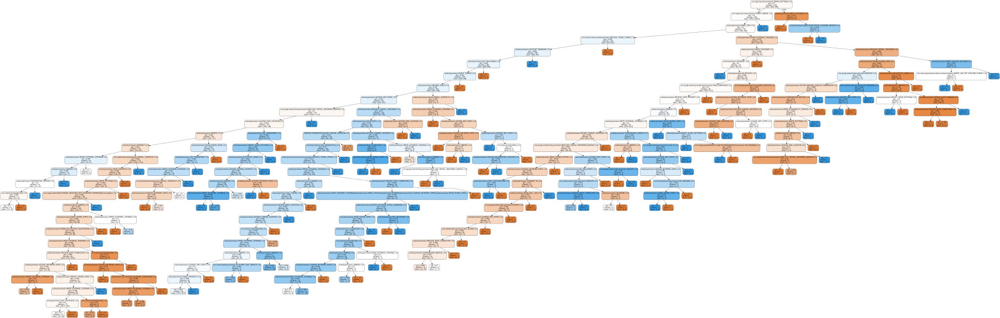

In [ ]:
from sklearn.tree import export_graphviz
import graphviz

# Escolher uma das árvores da floresta (exemplo: primeira árvore, índice 0)
estimator = model_rf.estimators_[0]

# Gerar gráfico da árvore de decisão
dot_data = export_graphviz(estimator, out_file=None,
                           feature_names=X_train.columns.tolist(),  # Certifique-se de que o nome das características está correto
                           filled=True, rounded=True,
                           special_characters=True)

# Criar o gráfico com graphviz
graph = graphviz.Source(dot_data)

# Salvar a imagem como PNG
graph.render(filename='tree', format='png', cleanup=True)  # 'cleanup=True' remove arquivos temporários

# Exibir a imagem da árvore
graph


In [ ]:
from sklearn.tree import export_graphviz
import pydotplus
from IPython.display import Image

# Escolher uma das árvores da floresta (exemplo: primeira árvore, índice 0)
estimator = model_rf.estimators_[0]

# Gerar gráfico da árvore de decisão
dot_data = export_graphviz(estimator, out_file=None,
                           feature_names=X_train.columns,
                           filled=True, rounded=True,
                           special_characters=True)

# Criar o gráfico com pydotplus
graph = pydotplus.graph_from_dot_data(dot_data)

# Configurar tamanho e resolução da imagem
graph.set_size('"128,128"')  # Ajuste o tamanho conforme necessário
graph.set_resolution(4000)  # Definir resolução

# Salvar a imagem como PNG
graph.write_png("tree.png")

# Exibir a imagem da árvore
Image(graph.create_png())


dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.0680598 to fit

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.0680598 to fit



#Testand graficos

In [ ]:
# Salvar histórico do treinamento
history = model.fit(X_train, y_train, batch_size=32, epochs=50, validation_data=(X_test, y_test), callbacks=[print_callback])

# Salvar relatório de classificação e matriz de confusão em dicionários
classification_reports['API Calls'] = classification_report(y_test_classes, y_pred_classes, output_dict=True)
confusion_matrices['API Calls'] = conf_matrix

# Adicione o código para os outros modelos também


Epoch 1/50
52/53 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - accuracy: 0.9916 - loss: 0.0180
Época 1:
Número de amostras no treino: 1672
Número de amostras no teste: 418
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - accuracy: 0.9917 - loss: 0.0180 - val_accuracy: 0.9856 - val_loss: 0.0258
Epoch 2/50
50/53 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.9837 - loss: 0.0243
Época 2:
Número de amostras no treino: 1672
Número de amostras no teste: 418
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - accuracy: 0.9843 - loss: 0.0235 - val_accuracy: 0.9833 - val_loss: 0.0447
Epoch 3/50
48/53 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.9907 - loss: 0.0209
Época 3:
Número de amostras no treino: 1672
Número de amostras no teste: 418
53/53 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - accuracy: 0.9907 - loss: 0.0208 - val_accuracy: 0.9833 - val_loss: 0.0302
Epoch 4/50
52/53 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - accuracy: 0.9945 - loss: 0.0114
Época 4:
Número de amostras no treino: 1672
Número de amostras no teste: 418
53/5

NameError: name 'classification_reports' is not defined

<ipython-input-12-5e1c87bffc50>:26: ParserWarning: Skipping line 24: expected 5832 fields, saw 6408
Skipping line 34: expected 5832 fields, saw 6695
Skipping line 51: expected 5832 fields, saw 6473
Skipping line 59: expected 5832 fields, saw 7106
Skipping line 88: expected 5832 fields, saw 6695
Skipping line 89: expected 5832 fields, saw 6002
Skipping line 99: expected 5832 fields, saw 5901
Skipping line 108: expected 5832 fields, saw 6002
Skipping line 112: expected 5832 fields, saw 6121
Skipping line 119: expected 5832 fields, saw 6060
Skipping line 126: expected 5832 fields, saw 6277
Skipping line 133: expected 5832 fields, saw 7420

  data_benign = pd.read_csv(csv_file_benign, encoding='ISO-8859-1', sep=';', names=range(max_num_cols), quoting=csv.QUOTE_NONE, on_bad_lines='warn')
<ipython-input-12-5e1c87bffc50>:26: ParserWarning: Skipping line 160: expected 5832 fields, saw 6523
Skipping line 174: expected 5832 fields, saw 5854
Skipping line 175: expected 5832 fields, saw 6475
Skipp

Epoch 1/50
48/49 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - accuracy: 0.5473 - loss: 0.7647
Época 1:
Número de amostras no treino: 1672
Número de amostras no teste: 418
49/49 ━━━━━━━━━━━━━━━━━━━━ 3s 42ms/step - accuracy: 0.5500 - loss: 0.7611 - val_accuracy: 0.7526 - val_loss: 0.5533
Epoch 2/50
48/49 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - accuracy: 0.7370 - loss: 0.5224
Época 2:
Número de amostras no treino: 1672
Número de amostras no teste: 418
49/49 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - accuracy: 0.7368 - loss: 0.5230 - val_accuracy: 0.7168 - val_loss: 0.5298
Epoch 3/50
48/49 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.7440 - loss: 0.4975
Época 3:
Número de amostras no treino: 1672
Número de amostras no teste: 418
49/49 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - accuracy: 0.7443 - loss: 0.4975 - val_accuracy: 0.7679 - val_loss: 0.5362
Epoch 4/50
48/49 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.7762 - loss: 0.4612
Época 4:
Número de amostras no treino: 1672
Número de amostras no teste: 418
49/4

<ipython-input-12-5e1c87bffc50>:26: ParserWarning: Skipping line 9: expected 197 fields, saw 200
Skipping line 10: expected 197 fields, saw 207
Skipping line 14: expected 197 fields, saw 201
Skipping line 18: expected 197 fields, saw 203
Skipping line 19: expected 197 fields, saw 209
Skipping line 20: expected 197 fields, saw 199
Skipping line 24: expected 197 fields, saw 211
Skipping line 31: expected 197 fields, saw 207
Skipping line 32: expected 197 fields, saw 207
Skipping line 33: expected 197 fields, saw 201
Skipping line 34: expected 197 fields, saw 200
Skipping line 35: expected 197 fields, saw 199
Skipping line 36: expected 197 fields, saw 198
Skipping line 41: expected 197 fields, saw 207
Skipping line 49: expected 197 fields, saw 202
Skipping line 51: expected 197 fields, saw 211
Skipping line 53: expected 197 fields, saw 203
Skipping line 54: expected 197 fields, saw 205
Skipping line 58: expected 197 fields, saw 198
Skipping line 60: expected 197 fields, saw 202
Skipping l

Modelo salvo como 'MLP_API Calls.h5'
Epoch 1/50


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


25/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5565 - loss: 0.7355
Época 1:
Número de amostras no treino: 1672
Número de amostras no teste: 418
28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5650 - loss: 0.7239 - val_accuracy: 0.6964 - val_loss: 0.5741
Epoch 2/50
15/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.7589 - loss: 0.4714  
Época 2:
Número de amostras no treino: 1672
Número de amostras no teste: 418
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.7474 - loss: 0.4889 - val_accuracy: 0.7054 - val_loss: 0.5697
Epoch 3/50
23/28 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.7977 - loss: 0.4470
Época 3:
Número de amostras no treino: 1672
Número de amostras no teste: 418
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.7931 - loss: 0.4530 - val_accuracy: 0.6964 - val_loss: 0.5691
Epoch 4/50
15/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.7766 - loss: 0.4435 
Época 4:
Número de amostras no treino: 1672
Número de amostras no teste: 418
28/28 ━━━━━━━━━━━━

Modelo salvo como 'MLP_Opcodes.h5'
Epoch 1/50


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


52/53 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.6307 - loss: 0.6198
Época 1:
Número de amostras no treino: 1672
Número de amostras no teste: 418
53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - accuracy: 0.6362 - loss: 0.6140 - val_accuracy: 0.9833 - val_loss: 0.1398
Epoch 2/50
45/53 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.9634 - loss: 0.1354
Época 2:
Número de amostras no treino: 1672
Número de amostras no teste: 418
53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.9656 - loss: 0.1298 - val_accuracy: 0.9904 - val_loss: 0.0362
Epoch 3/50
49/53 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.9795 - loss: 0.0666
Época 3:
Número de amostras no treino: 1672
Número de amostras no teste: 418
53/53 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - accuracy: 0.9803 - loss: 0.0643 - val_accuracy: 0.9856 - val_loss: 0.0268
Epoch 4/50
47/53 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.9924 - loss: 0.0274
Época 4:
Número de amostras no treino: 1672
Número de amostras no teste: 418
53/53 ━━━━━━━━━━━━━━━

Modelo salvo como 'MLP_Permissions.h5'

Relatório de Classificação para API Calls:
              precision    recall  f1-score   support

     benigno       0.76      0.79      0.78       201
     maligno       0.77      0.74      0.76       191

    accuracy                           0.77       392
   macro avg       0.77      0.77      0.77       392
weighted avg       0.77      0.77      0.77       392


Relatório de Classificação para Opcodes:
              precision    recall  f1-score   support

     benigno       0.82      0.65      0.72       127
     maligno       0.64      0.81      0.71        97

    accuracy                           0.72       224
   macro avg       0.73      0.73      0.72       224
weighted avg       0.74      0.72      0.72       224


Relatório de Classificação para Permissions:
              precision    recall  f1-score   support

     benigno       0.97      1.00      0.99       211
     maligno       1.00      0.97      0.99       207

    accurac

<ipython-input-12-5e1c87bffc50>:108: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels([''] + ['benigno', 'maligno'])
<ipython-input-12-5e1c87bffc50>:109: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels([''] + ['benigno', 'maligno'])
<ipython-input-12-5e1c87bffc50>:108: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels([''] + ['benigno', 'maligno'])
<ipython-input-12-5e1c87bffc50>:109: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels([''] + ['benigno', 'maligno'])
<ipython-input-12-5e1c87bffc50>:108: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_

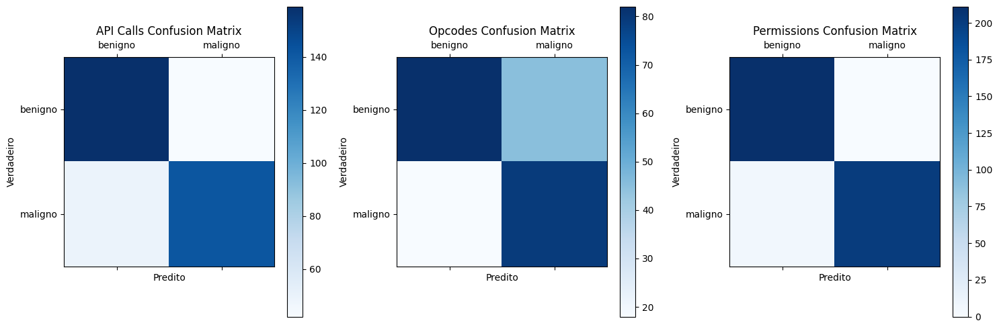

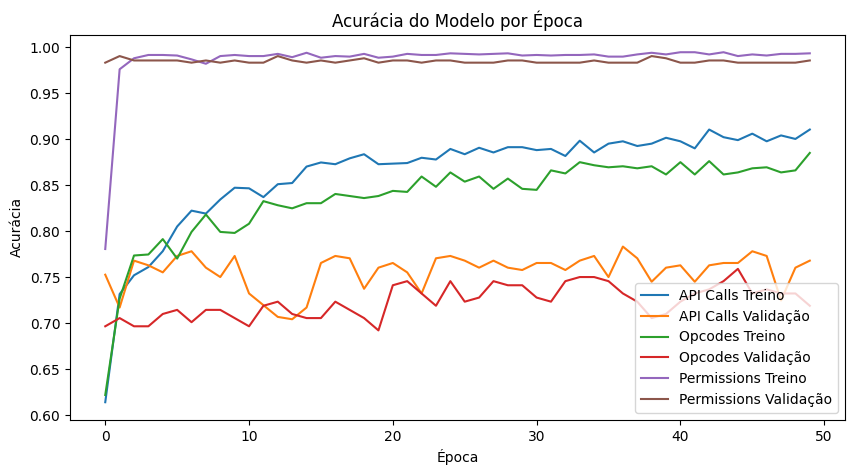

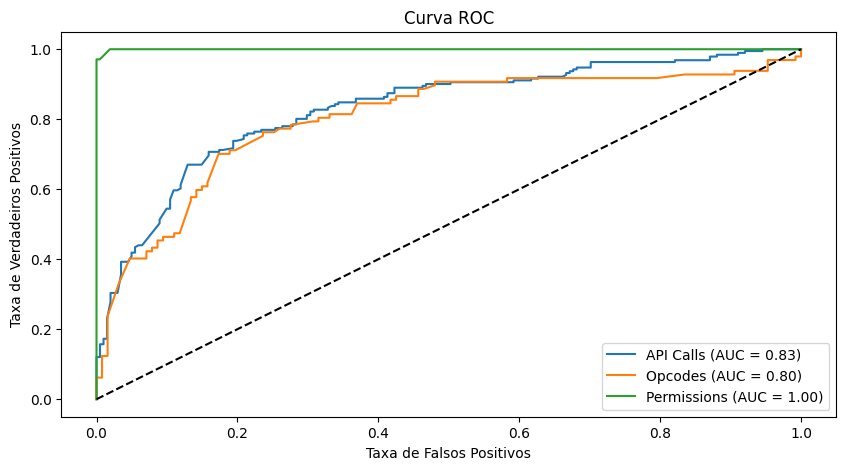

In [ ]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.utils import resample
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.callbacks import LambdaCallback
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
import matplotlib.pyplot as plt
import csv

# Função de callback para imprimir informações sobre o número de amostras
def on_epoch_end(epoch, logs):
    print(f"\nÉpoca {epoch + 1}:")
    print(f"Número de amostras no treino: {X_train.shape[0]}")
    print(f"Número de amostras no teste: {X_test.shape[0]}")

# Função para carregar e preparar os dados
def carregar_dados(csv_file_benign, csv_file_malign):
    num_cols_benign = pd.read_csv(csv_file_benign, encoding='ISO-8859-1', sep=';', quoting=csv.QUOTE_NONE, on_bad_lines='skip').shape[1]
    num_cols_malign = pd.read_csv(csv_file_malign, encoding='ISO-8859-1', sep=';', quoting=csv.QUOTE_NONE, on_bad_lines='skip').shape[1]
    max_num_cols = max(num_cols_benign, num_cols_malign)

    data_benign = pd.read_csv(csv_file_benign, encoding='ISO-8859-1', sep=';', names=range(max_num_cols), quoting=csv.QUOTE_NONE, on_bad_lines='warn')
    data_malign = pd.read_csv(csv_file_malign, encoding='ISO-8859-1', sep=';', names=range(max_num_cols), quoting=csv.QUOTE_NONE, on_bad_lines='warn')

    data_benign['classe'] = 'benigno'
    data_malign['classe'] = 'maligno'
    data_benign_downsampled = resample(data_benign, replace=False, n_samples=len(data_malign), random_state=42)
    data_full = pd.concat([data_benign_downsampled, data_malign], axis=0)

    X = data_full.iloc[:, :-1].apply(pd.to_numeric, errors='coerce').fillna(0)
    y = data_full.iloc[:, -1]

    label_encoder = LabelEncoder()
    y = label_encoder.fit_transform(y)
    X = X.astype(np.float32)
    y = y.astype(np.int32)

    return X, y

# Função para criar e treinar o modelo MLP
def treinar_modelo(X, y, input_dim, dropout_rate=0.2, epochs=50):
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
    y_train = to_categorical(y_train, num_classes=2)
    y_test = to_categorical(y_test, num_classes=2)

    model = Sequential([
        Dense(256, activation='sigmoid', input_shape=(input_dim,)),
        Dropout(dropout_rate),
        Dense(256, activation='relu'),
        Dense(2, activation='softmax')
    ])
    model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

    print_callback = LambdaCallback(on_epoch_end=on_epoch_end)
    history = model.fit(X_train, y_train, batch_size=32, epochs=epochs, validation_data=(X_test, y_test), callbacks=[print_callback])

    y_pred = model.predict(X_test)
    y_pred_classes = np.argmax(y_pred, axis=1)
    y_test_classes = np.argmax(y_test, axis=1)

    return y_test_classes, y_pred_classes, y_test, y_pred, model, history

dados = {
    'API Calls': ('api_calls_2b.csv', 'api_calls_2m.csv'),
    'Opcodes': ('opcodes_2b.csv', 'opcodes_2m.csv'),
    'Permissions': ('permissions_2b.csv', 'permissions_2m.csv')
}

classification_reports = []
confusion_matrices = []
histories = []
roc_curves = []

for nome, (csv_b, csv_m) in dados.items():
    X, y = carregar_dados(csv_b, csv_m)
    y_test_classes, y_pred_classes, y_test, y_pred, model, history = treinar_modelo(X, y, input_dim=X.shape[1], epochs=50)
    report = classification_report(y_test_classes, y_pred_classes, target_names=['benigno', 'maligno'])
    conf_matrix = confusion_matrix(y_test_classes, y_pred_classes)

    classification_reports.append((nome, report))
    confusion_matrices.append((nome, conf_matrix))
    histories.append((nome, history))

    # Calcular a curva ROC e AUC para o modelo atual
    fpr, tpr, _ = roc_curve(y_test[:, 1], y_pred[:, 1])
    roc_auc = auc(fpr, tpr)
    roc_curves.append((nome, fpr, tpr, roc_auc))

    model.save(f'MLP_{nome}.h5')
    print(f"Modelo salvo como 'MLP_{nome}.h5'")

# Exibir os relatórios de classificação
for model_name, report in classification_reports:
    print(f"\nRelatório de Classificação para {model_name}:\n{report}")

# Plotar as matrizes de confusão
fig, axes = plt.subplots(1, 3, figsize=(15, 5))
for ax, (model_name, conf_matrix) in zip(axes, confusion_matrices):
    cax = ax.matshow(conf_matrix, cmap='Blues')
    fig.colorbar(cax, ax=ax)
    ax.set_title(f'{model_name} Confusion Matrix')
    ax.set_xlabel('Predito')
    ax.set_ylabel('Verdadeiro')
    ax.set_xticklabels([''] + ['benigno', 'maligno'])
    ax.set_yticklabels([''] + ['benigno', 'maligno'])

plt.tight_layout()
plt.show()

# Plotar os gráficos de precisão (acurácia) ao longo das épocas
plt.figure(figsize=(10, 5))
for model_name, history in histories:
    plt.plot(history.history['accuracy'], label=f'{model_name} Treino')
    plt.plot(history.history['val_accuracy'], label=f'{model_name} Validação')
plt.title('Acurácia do Modelo por Época')
plt.xlabel('Época')
plt.ylabel('Acurácia')
plt.legend()
plt.show()

# Plotar as curvas ROC
plt.figure(figsize=(10, 5))
for model_name, fpr, tpr, roc_auc in roc_curves:
    plt.plot(fpr, tpr, label=f'{model_name} (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], 'k--')  # Diagonal de chance
plt.title('Curva ROC')
plt.xlabel('Taxa de Falsos Positivos')
plt.ylabel('Taxa de Verdadeiros Positivos')
plt.legend(loc='lower right')
plt.show()



Melhor valor de n_neighbors para API_Calls: 50

Relatório de Classificação para API_Calls:
               precision    recall  f1-score   support

     benigno       1.00      0.97      0.99       277
     maligno       0.96      1.00      0.98       166

    accuracy                           0.98       443
   macro avg       0.98      0.99      0.98       443
weighted avg       0.98      0.98      0.98       443

Matriz de Confusão para API_Calls:
 [[270   7]
 [  0 166]]

Validação Cruzada (5-fold) - Acurácia Média para API_Calls: 0.9656884875846501

Melhor valor de n_neighbors para Opcodes: 3

Relatório de Classificação para Opcodes:
               precision    recall  f1-score   support

     benigno       0.95      0.97      0.96       195
     maligno       0.95      0.90      0.93       105

    accuracy                           0.95       300
   macro avg       0.95      0.94      0.94       300
weighted avg       0.95      0.95      0.95       300

Matriz de Confusão para Op

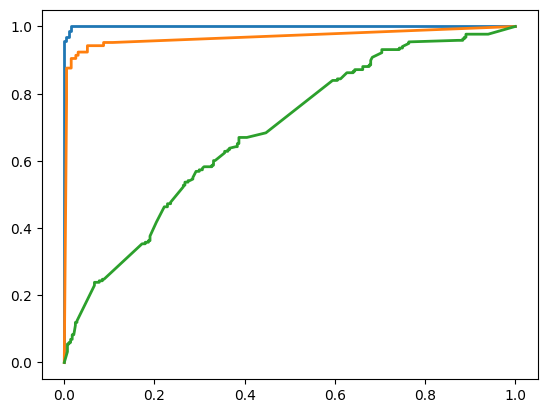

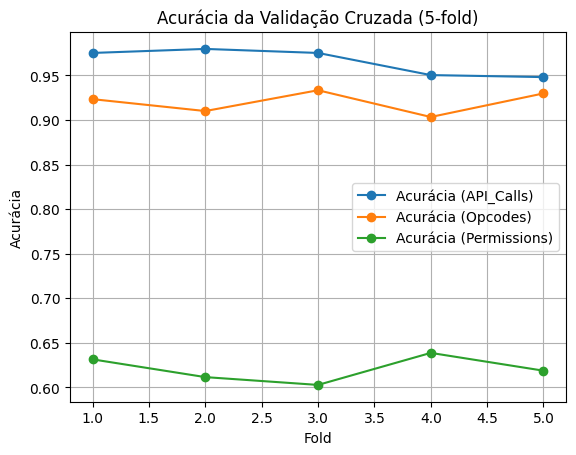

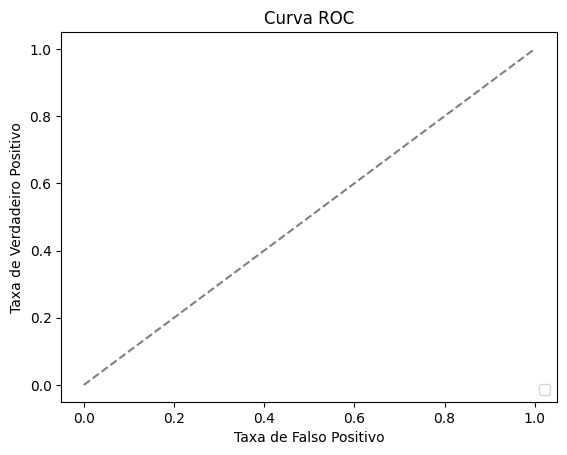

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
import numpy as np
import matplotlib.pyplot as plt
import pickle

# Função para treinar e avaliar o modelo KNN para um conjunto de dados específico
def train_and_evaluate_knn(data_benign_path, data_malign_path, model_name):
    # Carregar os arquivos CSV
    data_benign = pd.read_csv(data_benign_path, encoding='ISO-8859-1', sep=';', on_bad_lines='skip')
    data_malign = pd.read_csv(data_malign_path, encoding='ISO-8859-1', sep=';', on_bad_lines='skip')

    # Adicionar coluna de rótulo
    data_malign['label'] = 1
    data_benign['label'] = 0

    # Remover a coluna "Nome do Arquivo" de cada dataset
    data_benign = data_benign.drop(columns=['Nome do Arquivo'])
    data_malign = data_malign.drop(columns=['Nome do Arquivo'])

    # Concatenar os dados
    data = pd.concat([data_benign, data_malign], ignore_index=True)

    # Preencher valores faltantes com 0
    data = data.fillna(0)

    # Remover colunas não numéricas (como hashes, nomes de arquivos, etc.)
    data = data.apply(pd.to_numeric, errors='coerce').fillna(0)

    # Separar características e rótulos
    X = data.drop('label', axis=1)
    y = data['label']

    # Dividir os dados em conjuntos de treinamento e teste
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

    # Padronizar os dados com StandardScaler
    scaler = StandardScaler()
    X_train = scaler.fit_transform(X_train)
    X_test = scaler.transform(X_test)

    # Definir o intervalo de valores para n_neighbors
    param_grid = {'n_neighbors': [1, 3, 5, 7, 9, 11, 15, 20, 50, 75, 100]}

    # Realizar busca em grid para encontrar o melhor n_neighbors
    grid_search = GridSearchCV(KNeighborsClassifier(weights='distance'), param_grid, cv=5, scoring='accuracy')
    grid_search.fit(X_train, y_train)

    # Melhor valor de n_neighbors encontrado
    best_n_neighbors = grid_search.best_params_['n_neighbors']
    print(f"\nMelhor valor de n_neighbors para {model_name}: {best_n_neighbors}")

    # Usar o melhor modelo encontrado no GridSearch
    knn_best = grid_search.best_estimator_

    # Fazer previsões com o melhor modelo
    y_pred = knn_best.predict(X_test)
    y_pred_prob = knn_best.predict_proba(X_test)[:, 1]

    # Gerar o relatório de classificação
    report = classification_report(y_test, y_pred, target_names=['benigno', 'maligno'])
    print(f"\nRelatório de Classificação para {model_name}:\n", report)

    # Exibir a matriz de confusão
    conf_matrix = confusion_matrix(y_test, y_pred)
    print(f"Matriz de Confusão para {model_name}:\n", conf_matrix)

    # Gráfico de Acurácia (Validação Cruzada)
    cv_scores = cross_val_score(knn_best, X, y, cv=5)
    print(f"\nValidação Cruzada (5-fold) - Acurácia Média para {model_name}:", cv_scores.mean())

    # Adicionar curva de acurácia ao gráfico de acurácia
    plt.figure(1)
    plt.plot(range(1, 6), cv_scores, marker='o', label=f"Acurácia ({model_name})")

    # Gráfico ROC
    fpr, tpr, _ = roc_curve(y_test, y_pred_prob)
    roc_auc = auc(fpr, tpr)

    plt.figure(2)
    plt.plot(fpr, tpr, lw=2, label=f"{model_name} (área = {roc_auc:.2f})")

    # Salvando o modelo treinado
    arquivo_pickle = f"KNN_{model_name}_best.sav"
    pickle.dump(knn_best, open(arquivo_pickle, 'wb'))

# Chamando a função para os três conjuntos de dados
train_and_evaluate_knn('api_calls_2b.csv', 'api_calls_2m.csv', 'API_Calls')
train_and_evaluate_knn('opcodes_2b.csv', 'opcodes_2m.csv', 'Opcodes')
train_and_evaluate_knn('permissions_2b.csv', 'permissions_2m.csv', 'Permissions')

# Ajustando e exibindo o gráfico de acurácia
plt.figure(1)
plt.title("Acurácia da Validação Cruzada (5-fold)")
plt.xlabel("Fold")
plt.ylabel("Acurácia")
plt.grid()
plt.legend()
plt.show()

# Ajustando e exibindo o gráfico de ROC
plt.figure(2)
plt.plot([0, 1], [0, 1], color='grey', linestyle='--')
plt.xlabel("Taxa de Falso Positivo")
plt.ylabel("Taxa de Verdadeiro Positivo")
plt.title("Curva ROC")
plt.legend(loc="lower right")
plt.show()



Melhor valor de n_neighbors para API_Calls: 50

Relatório de Classificação para API_Calls:
               precision    recall  f1-score   support

     benigno       1.00      0.97      0.99       277
     maligno       0.96      1.00      0.98       166

    accuracy                           0.98       443
   macro avg       0.98      0.99      0.98       443
weighted avg       0.98      0.98      0.98       443

Matriz de Confusão para API_Calls:
 [[270   7]
 [  0 166]]

Validação Cruzada (5-fold) - Acurácia Média para API_Calls: 0.9656884875846501


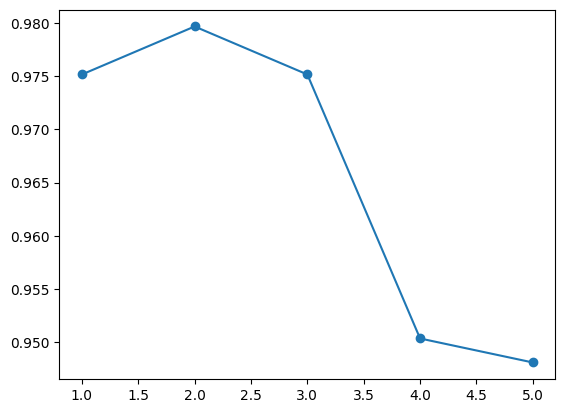

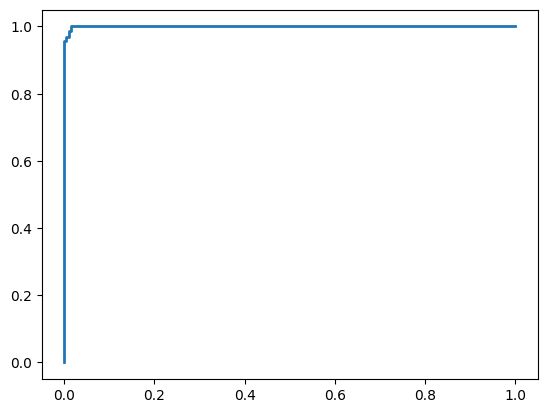

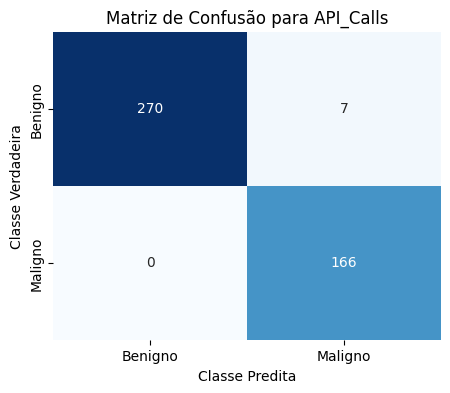


Melhor valor de n_neighbors para Opcodes: 3

Relatório de Classificação para Opcodes:
               precision    recall  f1-score   support

     benigno       0.95      0.97      0.96       195
     maligno       0.95      0.90      0.93       105

    accuracy                           0.95       300
   macro avg       0.95      0.94      0.94       300
weighted avg       0.95      0.95      0.95       300

Matriz de Confusão para Opcodes:
 [[190   5]
 [ 10  95]]

Validação Cruzada (5-fold) - Acurácia Média para Opcodes: 0.919953177257525


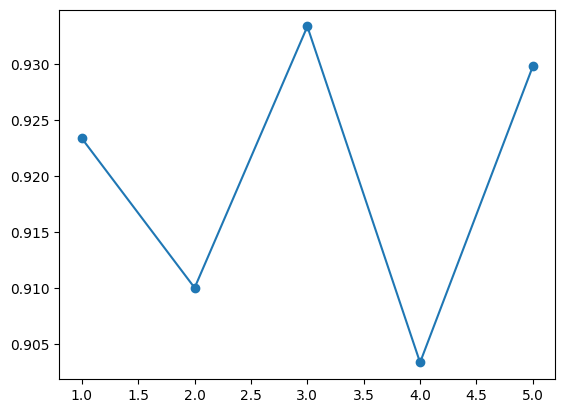

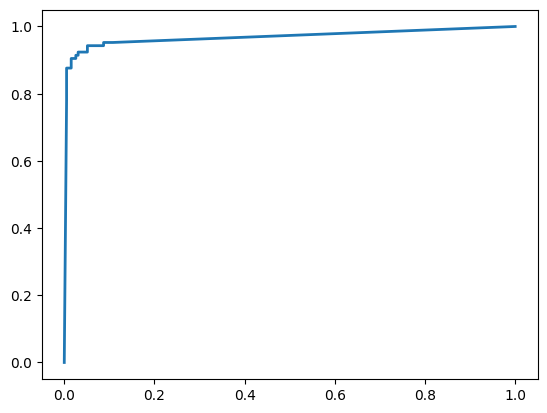

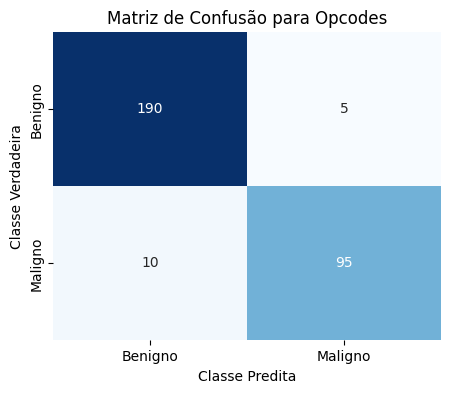


Melhor valor de n_neighbors para Permissions: 15

Relatório de Classificação para Permissions:
               precision    recall  f1-score   support

     benigno       0.67      0.71      0.69       284
     maligno       0.60      0.55      0.57       218

    accuracy                           0.64       502
   macro avg       0.64      0.63      0.63       502
weighted avg       0.64      0.64      0.64       502

Matriz de Confusão para Permissions:
 [[203  81]
 [ 98 120]]

Validação Cruzada (5-fold) - Acurácia Média para Permissions: 0.6206614659127959


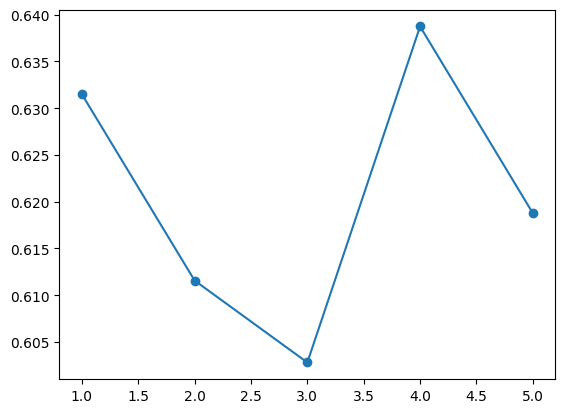

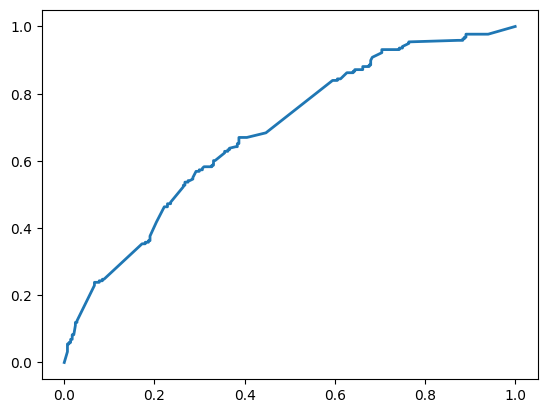

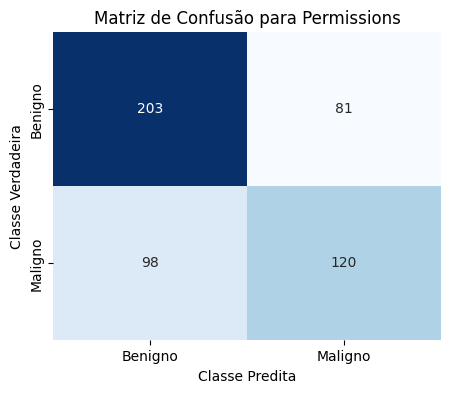

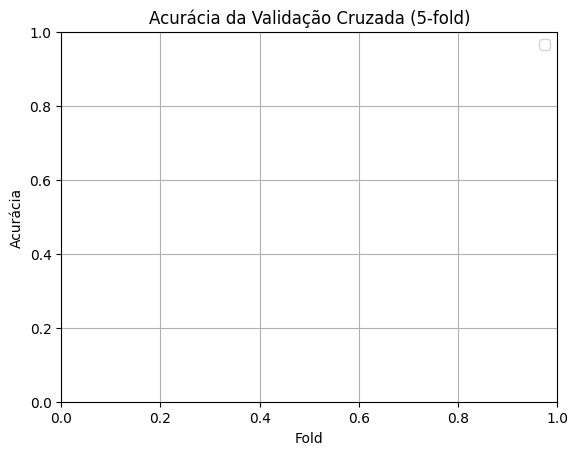

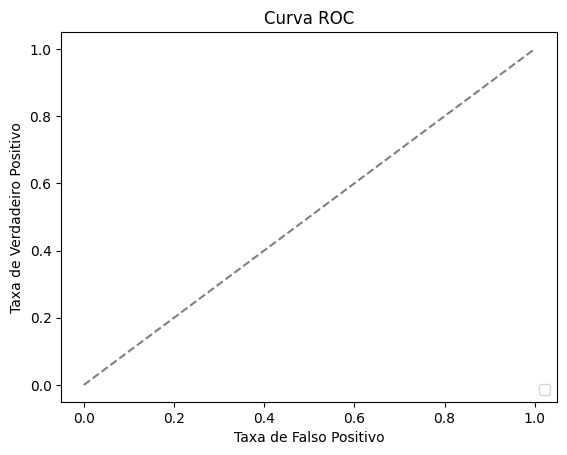

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pickle

# Função para treinar e avaliar o modelo KNN para um conjunto de dados específico
def train_and_evaluate_knn(data_benign_path, data_malign_path, model_name):
    # Carregar os arquivos CSV
    data_benign = pd.read_csv(data_benign_path, encoding='ISO-8859-1', sep=';', on_bad_lines='skip')
    data_malign = pd.read_csv(data_malign_path, encoding='ISO-8859-1', sep=';', on_bad_lines='skip')

    # Adicionar coluna de rótulo
    data_malign['label'] = 1
    data_benign['label'] = 0

    # Remover a coluna "Nome do Arquivo" de cada dataset
    data_benign = data_benign.drop(columns=['Nome do Arquivo'])
    data_malign = data_malign.drop(columns=['Nome do Arquivo'])

    # Concatenar os dados
    data = pd.concat([data_benign, data_malign], ignore_index=True)

    # Preencher valores faltantes com 0
    data = data.fillna(0)

    # Remover colunas não numéricas (como hashes, nomes de arquivos, etc.)
    data = data.apply(pd.to_numeric, errors='coerce').fillna(0)

    # Separar características e rótulos
    X = data.drop('label', axis=1)
    y = data['label']

    # Dividir os dados em conjuntos de treinamento e teste
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

    # Padronizar os dados com StandardScaler
    scaler = StandardScaler()
    X_train = scaler.fit_transform(X_train)
    X_test = scaler.transform(X_test)

    # Definir o intervalo de valores para n_neighbors
    param_grid = {'n_neighbors': [1, 3, 5, 7, 9, 11, 15, 20, 50, 75, 100]}

    # Realizar busca em grid para encontrar o melhor n_neighbors
    grid_search = GridSearchCV(KNeighborsClassifier(weights='distance'), param_grid, cv=5, scoring='accuracy')
    grid_search.fit(X_train, y_train)

    # Melhor valor de n_neighbors encontrado
    best_n_neighbors = grid_search.best_params_['n_neighbors']
    print(f"\nMelhor valor de n_neighbors para {model_name}: {best_n_neighbors}")

    # Usar o melhor modelo encontrado no GridSearch
    knn_best = grid_search.best_estimator_

    # Fazer previsões com o melhor modelo
    y_pred = knn_best.predict(X_test)
    y_pred_prob = knn_best.predict_proba(X_test)[:, 1]

    # Gerar o relatório de classificação
    report = classification_report(y_test, y_pred, target_names=['benigno', 'maligno'])
    print(f"\nRelatório de Classificação para {model_name}:\n", report)

    # Exibir a matriz de confusão
    conf_matrix = confusion_matrix(y_test, y_pred)
    print(f"Matriz de Confusão para {model_name}:\n", conf_matrix)

    # Gráfico de Acurácia (Validação Cruzada)
    cv_scores = cross_val_score(knn_best, X, y, cv=5)
    print(f"\nValidação Cruzada (5-fold) - Acurácia Média para {model_name}:", cv_scores.mean())

    # Adicionar curva de acurácia ao gráfico de acurácia
    plt.figure(1)
    plt.plot(range(1, 6), cv_scores, marker='o', label=f"Acurácia ({model_name})")

    # Gráfico ROC
    fpr, tpr, _ = roc_curve(y_test, y_pred_prob)
    roc_auc = auc(fpr, tpr)

    plt.figure(2)
    plt.plot(fpr, tpr, lw=2, label=f"{model_name} (área = {roc_auc:.2f})")

    # Gráfico de Matriz de Confusão
    plt.figure(figsize=(5, 4))
    sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', cbar=False, xticklabels=['Benigno', 'Maligno'], yticklabels=['Benigno', 'Maligno'])
    plt.xlabel("Classe Predita")
    plt.ylabel("Classe Verdadeira")
    plt.title(f"Matriz de Confusão para {model_name}")
    plt.show()

    # Salvando o modelo treinado
    arquivo_pickle = f"KNN_{model_name}_best.sav"
    pickle.dump(knn_best, open(arquivo_pickle, 'wb'))

# Chamando a função para os três conjuntos de dados
train_and_evaluate_knn('api_calls_2b.csv', 'api_calls_2m.csv', 'API_Calls')
train_and_evaluate_knn('opcodes_2b.csv', 'opcodes_2m.csv', 'Opcodes')
train_and_evaluate_knn('permissions_2b.csv', 'permissions_2m.csv', 'Permissions')

# Ajustando e exibindo o gráfico de acurácia
plt.figure(1)
plt.title("Acurácia da Validação Cruzada (5-fold)")
plt.xlabel("Fold")
plt.ylabel("Acurácia")
plt.grid()
plt.legend()
plt.show()

# Ajustando e exibindo o gráfico de ROC
plt.figure(2)
plt.plot([0, 1], [0, 1], color='grey', linestyle='--')
plt.xlabel("Taxa de Falso Positivo")
plt.ylabel("Taxa de Verdadeiro Positivo")
plt.title("Curva ROC")
plt.legend(loc="lower right")
plt.show()



Acurácia do teste para API_Calls: 1.0

Relatório de Classificação para API_Calls:
               precision    recall  f1-score   support

     benigno       1.00      1.00      1.00       267
     maligno       1.00      1.00      1.00       176

    accuracy                           1.00       443
   macro avg       1.00      1.00      1.00       443
weighted avg       1.00      1.00      1.00       443

Matriz de Confusão para API_Calls:
 [[267   0]
 [  0 176]]


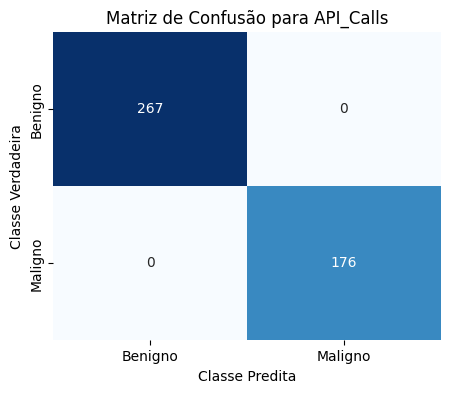

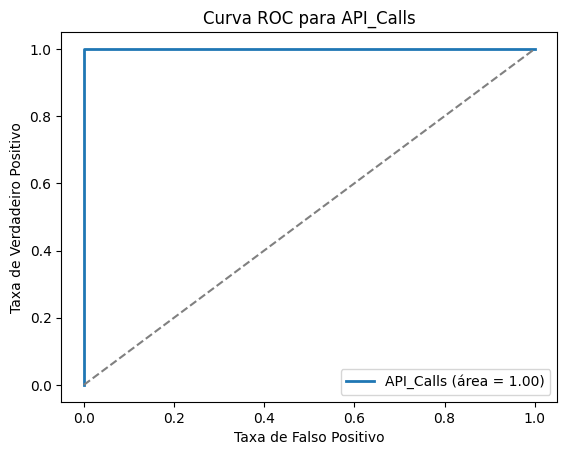


Acurácia do teste para Opcodes: 1.0

Relatório de Classificação para Opcodes:
               precision    recall  f1-score   support

     benigno       1.00      1.00      1.00       196
     maligno       1.00      1.00      1.00       104

    accuracy                           1.00       300
   macro avg       1.00      1.00      1.00       300
weighted avg       1.00      1.00      1.00       300

Matriz de Confusão para Opcodes:
 [[196   0]
 [  0 104]]


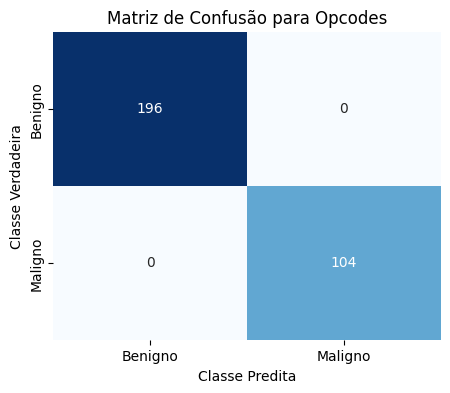

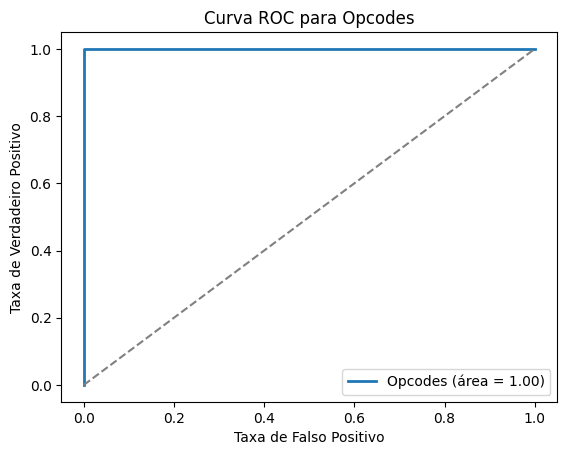


Acurácia do teste para Permissions: 0.6792828685258964

Relatório de Classificação para Permissions:
               precision    recall  f1-score   support

     benigno       0.71      0.77      0.74       293
     maligno       0.63      0.56      0.59       209

    accuracy                           0.68       502
   macro avg       0.67      0.66      0.66       502
weighted avg       0.68      0.68      0.68       502

Matriz de Confusão para Permissions:
 [[225  68]
 [ 93 116]]


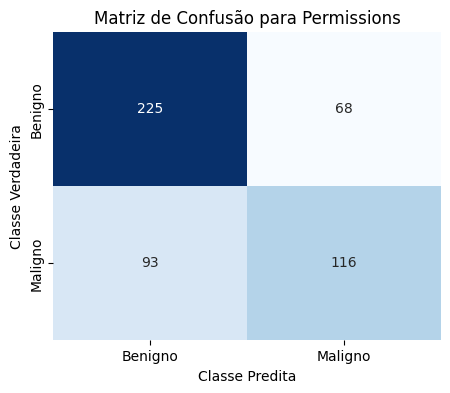

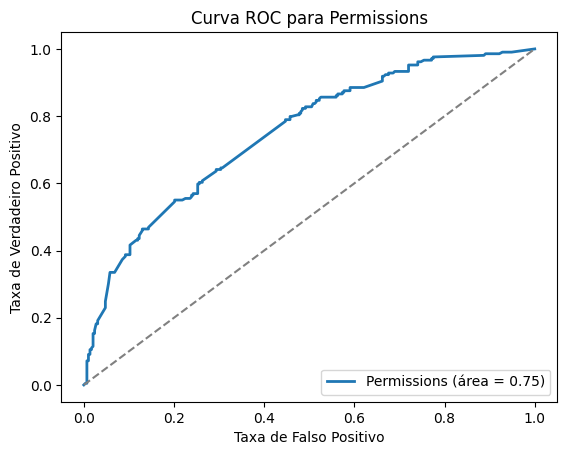

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, roc_curve, auc
import matplotlib.pyplot as plt
import seaborn as sns
import pickle

# Função para treinar e avaliar o modelo RandomForest para cada conjunto de dados
def train_and_evaluate_rf(data_benign_path, data_malign_path, model_name, n_estimators=100):
    # Carregar os arquivos CSV
    data_benign = pd.read_csv(data_benign_path, encoding='ISO-8859-1', sep=';', index_col=False, on_bad_lines='skip')
    data_malign = pd.read_csv(data_malign_path, encoding='ISO-8859-1', sep=';', index_col=False, on_bad_lines='skip')

    # Adicionar coluna de rótulo
    data_malign['label'] = 1
    data_benign['label'] = 0

    # Remover a coluna "Nome do Arquivo" de cada dataset
    data_benign = data_benign.drop(columns=['Nome do Arquivo'])
    data_malign = data_malign.drop(columns=['Nome do Arquivo'])

    # Concatenar os dados
    data = pd.concat([data_malign, data_benign], ignore_index=True)

    # Preencher valores faltantes com 0 e manter apenas colunas numéricas
    data = data.fillna(0).select_dtypes(include=[float, int])

    # Separar características e rótulos
    X = data.drop('label', axis=1)
    y = data['label']

    # Dividir os dados em conjuntos de treinamento e teste
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

    # Treinar o modelo Random Forest
    model_rf = RandomForestClassifier(n_estimators=n_estimators, random_state=3)
    model_rf.fit(X_train, y_train)

    # Fazer previsões e calcular a acurácia
    y_pred = model_rf.predict(X_test)
    accuracy = accuracy_score(y_test, y_pred)
    print(f'\nAcurácia do teste para {model_name}:', accuracy)

    # Gerar relatório de classificação
    report = classification_report(y_test, y_pred, target_names=['benigno', 'maligno'])
    print(f"\nRelatório de Classificação para {model_name}:\n", report)

    # Exibir a matriz de confusão
    conf_matrix = confusion_matrix(y_test, y_pred)
    print(f"Matriz de Confusão para {model_name}:\n", conf_matrix)

    # Gráfico de Matriz de Confusão
    plt.figure(figsize=(5, 4))
    sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', cbar=False, xticklabels=['Benigno', 'Maligno'], yticklabels=['Benigno', 'Maligno'])
    plt.xlabel("Classe Predita")
    plt.ylabel("Classe Verdadeira")
    plt.title(f"Matriz de Confusão para {model_name}")
    plt.show()

    # Curva ROC
    y_pred_prob = model_rf.predict_proba(X_test)[:, 1]
    fpr, tpr, _ = roc_curve(y_test, y_pred_prob)
    roc_auc = auc(fpr, tpr)

    plt.figure(2)
    plt.plot(fpr, tpr, lw=2, label=f"{model_name} (área = {roc_auc:.2f})")
    plt.plot([0, 1], [0, 1], color='grey', linestyle='--')
    plt.xlabel("Taxa de Falso Positivo")
    plt.ylabel("Taxa de Verdadeiro Positivo")
    plt.title(f"Curva ROC para {model_name}")
    plt.legend(loc="lower right")
    plt.show()

    # Salvando o modelo treinado
    arquivo_pickle = f"RandomForest_{model_name}.sav"
    pickle.dump(model_rf, open(arquivo_pickle, 'wb'))

# Chamando a função para os três conjuntos de dados
train_and_evaluate_rf('api_calls_2b.csv', 'api_calls_2m.csv', 'API_Calls')
train_and_evaluate_rf('opcodes_2b.csv', 'opcodes_2m.csv', 'Opcodes')
train_and_evaluate_rf('permissions_2b.csv', 'permissions_2m.csv', 'Permissions')
